# Introduction

In [ ]:
Data Credit: ourworldindata.org

The COVID-19 pandemic, caused by the novel coronavirus SARS-CoV-2, has had a profound and lasting impact on global health, economies, and societies. 
From its emergence in late 2019, the virus rapidly spread across the world, leading to widespread illness, overwhelmed healthcare systems, and tragically, millions of deaths. 
Understanding the dynamics of the pandemic, including its spread, severity, and the effectiveness of interventions, has been crucial in guiding public health responses
and mitigating its impact.
    
Analyzing COVID-19 data has played a pivotal role in this understanding. By collecting and examining data on cases, deaths, hospitalizations, and other relevant metrics, 
researchers and policymakers have been able to track the course of the pandemic, identify trends and patterns, and assess the effectiveness of various strategies aimed at 
controlling the virus. This data-driven approach has been essential in informing decisions about lockdowns, mask mandates, vaccination campaigns, and other measures
taken to protect public health.

In the following analysis, we will delve into various aspects of COVID-19 data, exploring trends in case numbers, mortality rates, and vaccination coverage across different
regions and populations. By examining this data, we aim to gain insights into the factors that have influenced the pandemic's trajectory, identify disparities in its impact,
and draw lessons that can help us better prepare for future health crises.

PS: ALL ANALYSIS ATTEMPTED OR DONE ARE NOT FOR CONCLUSION BUT RECOMMENDATION AND ARE SUBJECTED TO EXPERTS SCRUTINY.

# Analysis

### Loading libraries and Dataset

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
data = pd.read_csv("owid-covid-data.csv")

In [5]:
data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429435 entries, 0 to 429434
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    429435 non-null  object 
 1   continent                                   402910 non-null  object 
 2   location                                    429435 non-null  object 
 3   date                                        429435 non-null  object 
 4   total_cases                                 411804 non-null  float64
 5   new_cases                                   410159 non-null  float64
 6   new_cases_smoothed                          408929 non-null  float64
 7   total_deaths                                411804 non-null  float64
 8   new_deaths                                  410608 non-null  float64
 9   new_deaths_smoothed                         409378 non-null  float64
 

In [7]:
data['total_cases']

0              0.0
1              0.0
2              0.0
3              0.0
4              0.0
            ...   
429430    266386.0
429431    266386.0
429432    266386.0
429433    266386.0
429434    266386.0
Name: total_cases, Length: 429435, dtype: float64

### TOtal cases by population

In [8]:
pivot_table = data.pivot_table(index=['continent'],
                              values=['population','total_cases'],
                              aggfunc='sum').reset_index()
pivot_table.sort_values(by='total_cases', ascending=False, inplace=True)

In [9]:
pivot_table

,continent,population,total_cases
1,Asia,7908539315276,2.521673e+11
2,Europe,1341870119506,2.367567e+11
3,North America,1005451818298,1.270737e+11
5,South America,731413161942,7.348457e+10
0,Africa,2387393435471,1.461689e+10
4,Oceania,75431427341,1.159805e+10


In [10]:
"""
Either this data has been tampered with OR we have some wrong continents or countries values because from the population values up there, they are incorrect.

Reason extra mind of Expetise and Gewneral Knowledge is important in analysis. This would have skewed the analysis.

<TYPE 1 and TYPE 2 error/>

"""

'\nEither this data has been tampered with OR we have some wrong continents or countries values because from the population values up there, they are incorrect.\n\nReason extra mind of Expetise and Gewneral Knowledge is important in analysis. This would have skewed the analysis.\n\n<TYPE 1 and TYPE 2 error/>\n\n'

In [11]:
data['continent'].unique()

array(['Asia', nan, 'Europe', 'Africa', 'Oceania', 'North America',
       'South America'], dtype=object)

In [12]:
"""
With just 6 continents, we have correct contients.

"""

'\nWith just 6 continents, we have correct contients.\n\n'

In [13]:
data['location'].nunique()

255

In [14]:
"""
LOL. Gotcha. Obviously this is wrong. So the country values are wrong because there are not 255 countries but 195

"""

'\nLOL. Gotcha. Obviously this is wrong. So the country values are wrong because there are not 255 countries but 195\n\n'

In [15]:
data['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Asia', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'East Timor',
       'Ecuador', 'Egypt', 'El Salvador', 'England', 'Equatorial Guine

In [16]:
"""
Realised from above that we have 255 countries listed in the location column which is wrong because we have just 195 regisgtered countries of the world.
So, we'll try to find the wrong inputs out.


"""

"\nRealised from above that we have 255 countries listed in the location column which is wrong because we have just 195 regisgtered countries of the world.\nSo, we'll try to find the wrong inputs out.\n\n\n"

In [17]:
"""
There are 195 registered known countries but we have 255 here, meaning we have about 60 wrong input here.
"""

'\nThere are 195 registered known countries but we have 255 here, meaning we have about 60 wrong input here.\n'

In [18]:
"""
So I checked online.Luckily I was able to get a list of countries in excel format.I am happy, makes my work faster and easier.

"""

'\nSo I checked online.Luckily I was able to get a list of countries in excel format.I am happy, makes my work faster and easier.\n\n'

In [19]:
real_countries = pd.read_excel('WorldCountriesList.xlsx')

real_countries

,Country,Abreviation,Capital City,Continent
0,Afghanistan,AFG,Kabul,Asia
1,Albania,ALB,Tirana,Europe
2,Algeria,DZA,Algiers,Africa
3,Andorra,AND,Andorra la Vella,Europe
4,Angola,AGO,Luanda,Africa
...,...,...,...,...
190,Venezuela,VEN,Caracas,S. America
191,Vietnam,VNM,Hanoi,Asia
192,Yemen,YEM,Sana'a,Asia
193,Zambia,ZMB,Lusaka,Africa


In [20]:
not_country = list(set(data['location'].unique()) - set(real_countries['Country']))

not_country

['Wallis and Futuna',
 'Bermuda',
 'Martinique',
 'Aruba',
 'Montserrat',
 'Wales',
 'Hong Kong',
 'Asia',
 'United States Virgin Islands',
 'World',
 'Vatican',
 'Isle of Man',
 'Northern Cyprus',
 'East Timor',
 'Cayman Islands',
 'Guam',
 'Oceania',
 'North America',
 'Northern Ireland',
 "Cote d'Ivoire",
 'Mayotte',
 'Pitcairn',
 'Saint Pierre and Miquelon',
 'Saint Barthelemy',
 'Northern Mariana Islands',
 'Gibraltar',
 'Greenland',
 'Micronesia (country)',
 'Saint Vincent and the Grenadines',
 'Sao Tome and Principe',
 'European Union (27)',
 'South America',
 'New Caledonia',
 'British Virgin Islands',
 'Tokelau',
 'Western Sahara',
 'Jersey',
 'French Polynesia',
 'Saint Martin (French part)',
 'Niue',
 'Turks and Caicos Islands',
 'Upper-middle-income countries',
 'England',
 'American Samoa',
 'Low-income countries',
 'Falkland Islands',
 'Anguilla',
 'Guernsey',
 'Cape Verde',
 'Palestine',
 'Czechia',
 'Saint Helena',
 'Democratic Republic of Congo',
 'Guadeloupe',
 'Scotl

In [21]:
len(not_country)

71

In [22]:
"""
So we were able to pick about 71 locations that are either not a country at all or wrongly spelt as to 60 exoected.
So by chance we have 11 more which is about 5.6% of the whole real known countries. So we can just ignore since it's
relatively insignificant.

"""

"\nSo we were able to pick about 71 locations that are either not a country at all or wrongly spelt as to 60 exoected.\nSo by chance we have 11 more which is about 5.6% of the whole real known countries. So we can just ignore since it's\nrelatively insignificant.\n\n"

### Droping rows with the wrong location value

In [23]:
for country in not_country:
    data.drop(list(data[data['location']==country].index), inplace=True)
#    for index in not_country_index:
#        data.drop(index)
        

#data.drop(list(data[data['location']==country].index), 0)

In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 308071 entries, 0 to 429434
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    308071 non-null  object 
 1   continent                                   308071 non-null  object 
 2   location                                    308071 non-null  object 
 3   date                                        308071 non-null  object 
 4   total_cases                                 308016 non-null  float64
 5   new_cases                                   306375 non-null  float64
 6   new_cases_smoothed                          305455 non-null  float64
 7   total_deaths                                308016 non-null  float64
 8   new_deaths                                  306823 non-null  float64
 9   new_deaths_smoothed                         305903 non-null  float64
 10  t

In [25]:
"""
About 28% of the records were drop. That may seem like a bad judgement call but I'd appreciate any other way to go about it.

"""

"\nAbout 28% of the records were drop. That may seem like a bad judgement call but I'd appreciate any other way to go about it.\n\n"

### Checking for Null values by columns

In [26]:
data.isna().sum()

iso_code                                        0
continent                                       0
location                                        0
date                                            0
total_cases                                    55
                                            ...  
population                                      0
excess_mortality_cumulative_absolute       296602
excess_mortality_cumulative                296602
excess_mortality                           296602
excess_mortality_cumulative_per_million    296602
Length: 67, dtype: int64

In [27]:
isna = pd.DataFrame(data.isna().sum(), columns=['Null values']).reset_index()
isna

,index,Null values
0,iso_code,0
1,continent,0
2,location,0
3,date,0
4,total_cases,55
...,...,...
62,population,0
63,excess_mortality_cumulative_absolute,296602
64,excess_mortality_cumulative,296602
65,excess_mortality,296602


In [28]:
# Number of columns with null values

len(isna[isna['Null values']>0])

61

In [29]:
"""
FYI, By dropping those rows up there, I was 2 columns short from numbers of columns with Null values.
I saw this because I had run the analysis before without catching the wron countries


"""

'\nFYI, By dropping those rows up there, I was 2 columns short from numbers of columns with Null values.\nI saw this because I had run the analysis before without catching the wron countries\n\n\n'

In [30]:
dict = pd.DataFrame(data.dtypes, columns=['ColumnType']).reset_index()
dict

,index,ColumnType
0,iso_code,object
1,continent,object
2,location,object
3,date,object
4,total_cases,float64
...,...,...
62,population,int64
63,excess_mortality_cumulative_absolute,float64
64,excess_mortality_cumulative,float64
65,excess_mortality,float64


### Categorical Features, cleaninng and imputation

In [31]:
dict['ColumnType'].unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

In [32]:
dict['ColumnType'].value_counts()

ColumnType
float64    61
object      5
int64       1
Name: count, dtype: int64

In [33]:
categorical_columns = data.select_dtypes(include=['object'])
numerical_columns = data.select_dtypes(exclude=['object'])

In [34]:
categorical_columns

,iso_code,continent,location,date,tests_units
0,AFG,Asia,Afghanistan,2020-01-05,NaN
1,AFG,Asia,Afghanistan,2020-01-06,NaN
2,AFG,Asia,Afghanistan,2020-01-07,NaN
3,AFG,Asia,Afghanistan,2020-01-08,NaN
4,AFG,Asia,Afghanistan,2020-01-09,NaN
...,...,...,...,...,...
429430,ZWE,Africa,Zimbabwe,2024-07-31,NaN
429431,ZWE,Africa,Zimbabwe,2024-08-01,NaN
429432,ZWE,Africa,Zimbabwe,2024-08-02,NaN
429433,ZWE,Africa,Zimbabwe,2024-08-03,NaN


In [35]:
categorical_columns.isna().sum()

iso_code            0
continent           0
location            0
date                0
tests_units    211148
dtype: int64

In [36]:
"""
Before addressing the wrong countries value, I had Null values in a my cartegorical columns but now just test_units column alone.
"""

'\nBefore addressing the wrong countries value, I had Null values in a my cartegorical columns but now just test_units column alone.\n'

In [37]:
#Convert date into datetime format

data['date'] = pd.to_datetime(data['date'])

In [38]:
data['continent'].value_counts(normalize=True)

continent
Africa           0.271691
Asia             0.244583
Europe           0.233722
North America    0.114123
Oceania          0.070662
South America    0.065219
Name: proportion, dtype: float64

In [39]:
data['tests_units'].value_counts(normalize=True)

tests_units
tests performed    0.738535
people tested      0.154215
samples tested     0.098573
units unclear      0.008677
Name: proportion, dtype: float64

In [40]:
(data['tests_units'].isna().sum()/len(data))*100

68.53874593843628

In [41]:
data['tests_units'].fillna('tests performed', inplace=True)

In [42]:
data[categorical_columns.columns].isna().sum()

iso_code       0
continent      0
location       0
date           0
tests_units    0
dtype: int64

### Numerical Features, cleaning, imputation, Stats, Correlation and Visualization

In [43]:
for col in numerical_columns.columns:
    data[col].fillna(data[col].mean(),inplace= True)

In [44]:
data[numerical_columns.columns].isna().sum()

total_cases                                0
new_cases                                  0
new_cases_smoothed                         0
total_deaths                               0
new_deaths                                 0
                                          ..
population                                 0
excess_mortality_cumulative_absolute       0
excess_mortality_cumulative                0
excess_mortality                           0
excess_mortality_cumulative_per_million    0
Length: 62, dtype: int64

In [45]:
data.isna().sum()

iso_code                                   0
continent                                  0
location                                   0
date                                       0
total_cases                                0
                                          ..
population                                 0
excess_mortality_cumulative_absolute       0
excess_mortality_cumulative                0
excess_mortality                           0
excess_mortality_cumulative_per_million    0
Length: 67, dtype: int64

In [46]:
data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457


In [47]:
data.describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,308071,3.080710e+05,3.080710e+05,3.080710e+05,3.080710e+05,308071.000000,308071.000000,308071.000000,308071.000000,308071.000000,...,308071.000000,308071.000000,308071.000000,308071.000000,308071.000000,3.080710e+05,3.080710e+05,308071.000000,308071.000000,308071.000000
mean,2022-04-20 14:25:34.905914112,2.294454e+06,2.502989e+03,2.510398e+03,2.575100e+04,22.790257,22.856527,97769.124267,105.345363,105.650810,...,32.655006,51.894546,3.076238,72.752499,0.724345,4.237240e+07,6.478567e+04,10.252571,11.081299,1867.604570
min,2020-01-01 00:00:00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,7.700000,1.188000,0.100000,53.280000,0.394000,1.133500e+04,-3.772610e+04,-44.230000,-95.920000,-1620.162000
25%,2021-02-26 00:00:00,1.122600e+04,0.000000e+00,1.430000e-01,1.250000e+02,0.000000,0.000000,1606.816000,0.000000,0.003000,...,24.700000,51.894546,1.400000,67.270000,0.609000,2.567024e+06,6.478567e+04,10.252571,11.081299,1867.604570
50%,2022-04-21 00:00:00,1.156670e+05,0.000000e+00,2.100000e+01,1.461000e+03,0.000000,0.143000,20155.080000,0.000000,2.993000,...,32.655006,51.894546,2.700000,74.080000,0.740000,9.534956e+06,6.478567e+04,10.252571,11.081299,1867.604570
75%,2023-06-13 00:00:00,9.708600e+05,0.000000e+00,4.150000e+02,1.104300e+04,0.000000,4.143000,123379.875000,0.000000,53.375000,...,38.100000,51.894546,3.800000,77.970000,0.829000,3.347587e+07,6.478567e+04,10.252571,11.081299,1867.604570
max,2024-08-14 00:00:00,1.034368e+08,4.047548e+07,5.782211e+06,1.193165e+06,47687.000000,6812.429000,763598.600000,226617.450000,32373.921000,...,76.100000,100.000000,13.800000,86.750000,0.957000,1.425887e+09,1.349776e+06,78.080000,378.220000,10293.515000
std,NaN,8.798102e+06,9.659652e+04,3.643659e+04,9.242362e+04,354.207142,132.205300,152347.634459,1203.655824,444.385438,...,11.507494,22.613965,2.446128,7.541280,0.147467,1.528266e+08,3.241517e+04,2.364864,4.468261,394.804772


In [48]:
numerical_columns.corr()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
total_cases,1.000000,0.071470,0.189431,0.790568,0.089498,0.239519,0.238183,0.014882,0.040119,0.220103,...,-0.006582,0.106267,0.117392,0.182671,0.202242,0.488764,0.762411,0.053236,-0.039347,0.166131
new_cases,0.071470,1.000000,0.377204,0.052644,0.298965,0.110590,0.007722,0.168049,0.059771,0.009062,...,0.001914,0.019319,0.014924,0.019350,0.020710,0.054619,0.316022,0.028481,0.080473,0.006054
new_cases_smoothed,0.189431,0.377204,1.000000,0.139516,0.109473,0.293182,0.020348,0.058503,0.158459,0.023890,...,0.005083,0.051413,0.039630,0.051375,0.054988,0.145017,0.339193,0.034082,0.092995,0.009670
total_deaths,0.790568,0.052644,0.139516,1.000000,0.128163,0.343106,0.124878,0.006805,0.018225,0.328360,...,-0.052395,0.136614,0.017720,0.136260,0.170280,0.384724,0.934399,0.229938,0.001559,0.263697
new_deaths,0.089498,0.298965,0.109473,0.128163,1.000000,0.373247,-0.008698,0.109577,0.029448,0.023905,...,-0.009380,0.025802,0.007315,0.032614,0.040766,0.090958,0.363806,0.181702,0.293509,0.015262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
population,0.488764,0.054619,0.145017,0.384724,0.090958,0.244035,-0.079390,-0.010335,-0.028028,-0.056639,...,0.024636,0.033582,-0.044962,0.000198,-0.018469,1.000000,0.791671,0.152870,0.044001,0.086567
excess_mortality_cumulative_absolute,0.762411,0.316022,0.339193,0.934399,0.363806,0.390182,0.024064,-0.031965,-0.037591,0.270286,...,-0.082620,-0.003218,-0.115034,-0.174879,-0.087809,0.791671,1.000000,0.304992,0.020816,0.344559
excess_mortality_cumulative,0.053236,0.028481,0.034082,0.229938,0.181702,0.191255,-0.005735,-0.028057,-0.017383,0.462656,...,0.000746,0.045730,-0.238107,-0.308512,-0.433901,0.152870,0.304992,1.000000,0.398051,0.610335
excess_mortality,-0.039347,0.080473,0.092995,0.001559,0.293509,0.313856,-0.122786,0.104592,0.138906,-0.024285,...,0.022243,-0.023599,-0.086580,-0.144704,-0.192482,0.044001,0.020816,0.398051,1.000000,0.054449


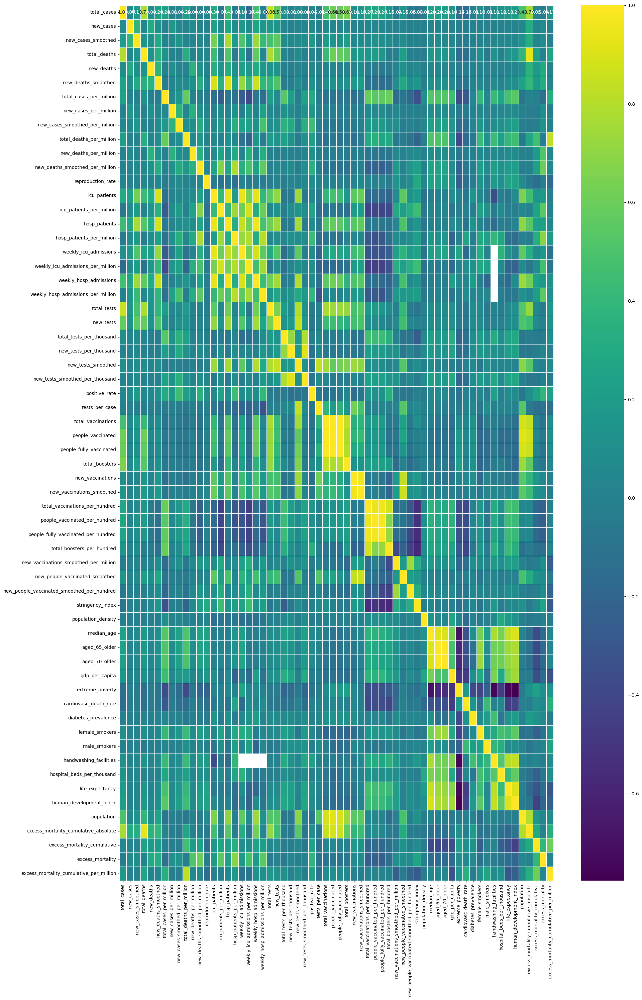

In [49]:
#Correlation matrix
plt.figure(figsize=(20, 30))
#fig.set_size_inches(5,15)
corr= numerical_columns.corr()
sns.heatmap(corr, annot=True, cmap= 'viridis',fmt='.2f', linewidths=0.5)
plt.tight_layout()
plt.show()

In [50]:
#Corelation of numerical features against tital cases

corr_list = []

for col in numerical_columns:
    corr_list.append(data['total_cases'].corr(data[col]))

corr_df = pd.DataFrame(corr_list, numerical_columns.columns, columns=['Correlation Value']).reset_index()

In [51]:
corr_df

,index,Correlation Value
0,total_cases,1.000000
1,new_cases,0.062438
2,new_cases_smoothed,0.165476
3,total_deaths,0.790568
4,new_deaths,0.087376
...,...,...
57,population,0.488248
58,excess_mortality_cumulative_absolute,0.185522
59,excess_mortality_cumulative,0.012954
60,excess_mortality,-0.009575


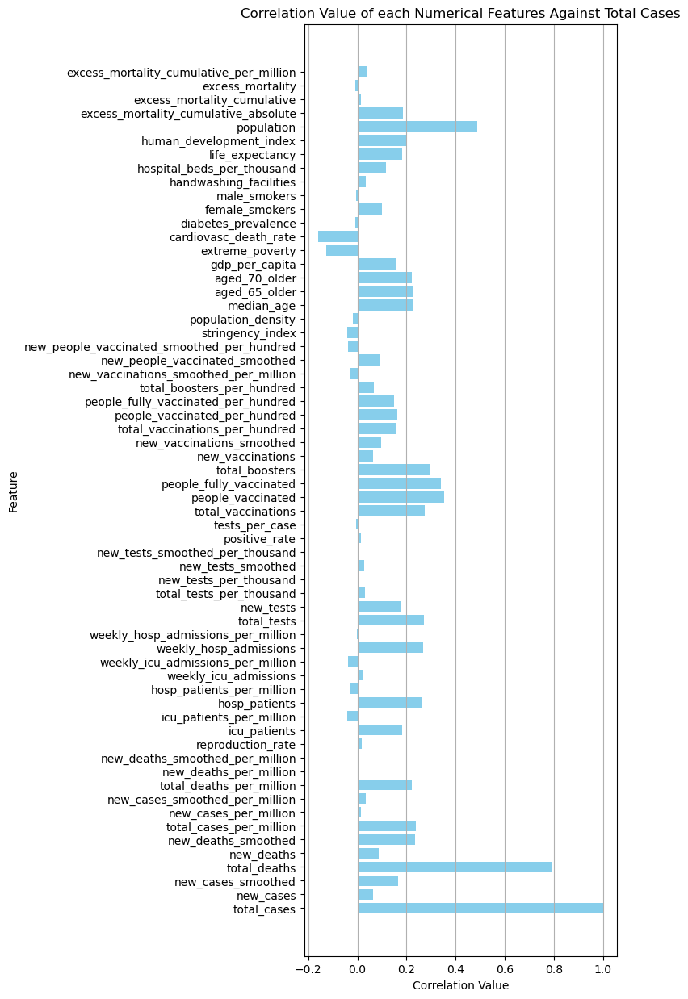

In [52]:
plt.figure(figsize=(5, 15))
plt.barh(numerical_columns.columns, corr_df['Correlation Value'], color='skyblue')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')
plt.title('Correlation Value of each Numerical Features Against Total Cases')
plt.grid(axis='x')
plt.show()

In [53]:
#Corelation of numerical features against tital deaths

corr_list = []

for col in numerical_columns:
    corr_list.append(data['total_deaths'].corr(data[col]))

corr_df = pd.DataFrame(corr_list, numerical_columns.columns, columns=['Correlation Value']).reset_index()

In [54]:
corr_df

,index,Correlation Value
0,total_cases,0.790568
1,new_cases,0.046334
2,new_cases_smoothed,0.122779
3,total_deaths,1.000000
4,new_deaths,0.127661
...,...,...
57,population,0.384317
58,excess_mortality_cumulative_absolute,0.245181
59,excess_mortality_cumulative,0.060334
60,excess_mortality,0.000409


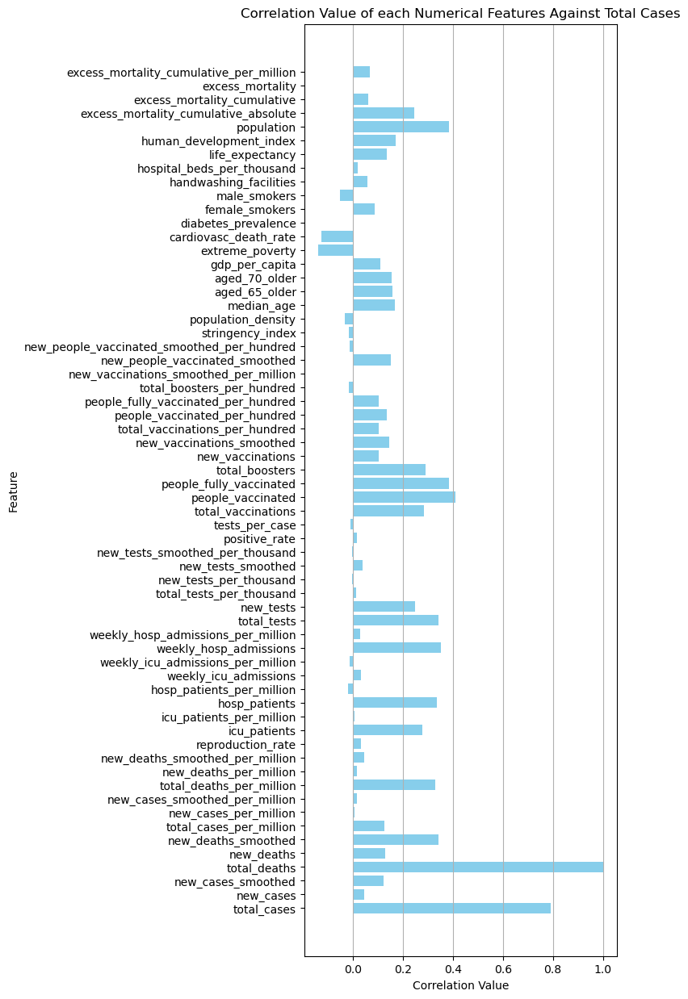

In [55]:
plt.figure(figsize=(5, 15))
plt.barh(numerical_columns.columns, corr_df['Correlation Value'], color='skyblue')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')
plt.title('Correlation Value of each Numerical Features Against Total Cases')
plt.grid(axis='x')
plt.show()

### First Pivot Table of Total Cases by Continents and Population together

In [56]:
continents = []
population = []

for continent in data['continent'].unique():
    continents.append(continent)
    population.append(data[data['continent']==continent]['population'].unique().sum())

pivot_table_now = pd.DataFrame({'continent':continents, 'population':population})
    #print(continent)

In [57]:
pivot_table_now.sort_values(by=['population'], ascending=False, inplace=True)

pivot_table_now

,continent,population
0,Asia,4682786577
2,Africa,1296863714
1,Europe,734789904
3,North America,595352510
4,South America,436508310
5,Oceania,44030306


In [58]:
"""
So after so much long ghurdle we were able to come close to the real life dataq we have online.
Yaaaayyyyy


"""

'\nSo after so much long ghurdle we were able to come close to the real life dataq we have online.\nYaaaayyyyy\n\n\n'

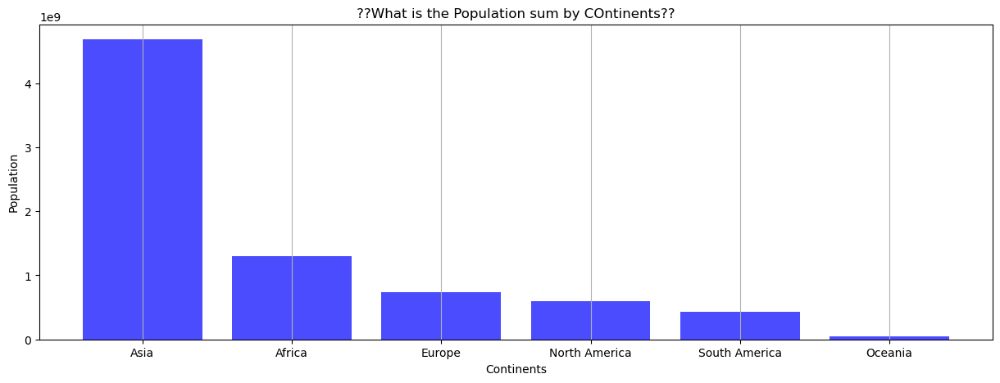

In [59]:
# Vizualization of Population by continents

plt.figure(figsize=(15, 5))
#plt.bar(pivot_table['continent'], pivot_table['total_cases'], color='blue', alpha=0.7)
plt.bar(pivot_table_now['continent'], pivot_table_now['population'], color='blue', alpha=0.7)
plt.xlabel('Continents')
plt.ylabel('Population')
plt.title('??What is the Population sum by COntinents??')
plt.grid(axis='x')
plt.show()

### I am trying to plot the maximum value of total cases for each year, hue by continent

In [60]:
"""
Since the total case count only changes with time and is a recurring count, that is, same patient could be counted the following day.

SO the pitale_table result below will be wrong.

"""

'\nSince the total case count only changes with time and is a recurring count, that is, same patient could be counted the following day.\n\nSO the pitale_table result below will be wrong.\n\n'

In [61]:
pivot_table_total_cases = data.pivot_table(index='continent',
                                           values='total_cases',
                                           aggfunc='sum'
    
).sort_values(by=['total_cases'], ascending=False)

pivot_table_total_cases

,total_cases
continent,
Asia,2.514045e+11
Europe,2.314803e+11
North America,1.253728e+11
South America,7.339164e+10
Africa,1.383996e+10
Oceania,1.136559e+10


In [ ]:
"""
So we can't use MEAN as the estimator/aggregation because total_cases is a cummulative frequency (THINK OUTLIERS). I mean, the number of cases at any instant is a cummulative
of the previous days, So I decided to use MAX instead as it will give the last recorded number of cases.

SEE WRONG PLOT BELOW
"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\760828855.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='date', ylabel='total_cases'>

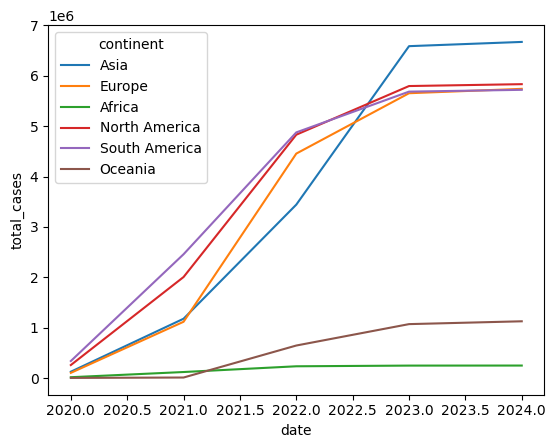

In [62]:
sns.lineplot(data=data,
                x=data['date'].dt.year,
                y='total_cases',
             hue='continent',
             estimator='mean',
             ci=None
               )

In [ ]:
"""
So we check for yearly and use the last record for each year.

"""

In [63]:
nth = 1
while nth <= len(data['date'].dt.year.unique()):
    if nth == 1:
        year_20 = data[data['date'].dt.year==2020][['continent', 'total_cases']].groupby(by=['continent']).max().rename(columns={'total_cases':'year_20'})
        nth+=1
    elif nth == 2:
        year_21 = data[data['date'].dt.year==2021][['continent', 'total_cases']].groupby(by=['continent']).max().rename(columns={'total_cases':'year_21'})
        nth+=1
    elif nth == 3:
        year_22 = data[data['date'].dt.year==2022][['continent', 'total_cases']].groupby(by=['continent']).max().rename(columns={'total_cases':'year_22'})
        nth+=1
    elif nth == 4:
        year_23 = data[data['date'].dt.year==2023][['continent', 'total_cases']].groupby(by=['continent']).max().rename(columns={'total_cases':'year_23'})
        nth+=1
    elif nth == 5:
        year_24 = data[data['date'].dt.year==2024][['continent', 'total_cases']].groupby(by=['continent']).max().rename(columns={'total_cases':'year_24'})
        nth+=1

In [64]:
total_cases_by_continent = pd.concat([year_20,year_21,year_22,year_23,year_24], axis=1)

total_cases_by_continent

,year_20,year_21,year_22,year_23,year_24
continent,,,,,
Africa,994911.0,3407937.0,4048232.0,4072636.0,4072765.0
Asia,10187850.0,34786802.0,62445650.0,99322727.0,99373219.0
Europe,3050248.0,12574779.0,37989547.0,38997490.0,38997490.0
North America,18890446.0,51878860.0,99019493.0,103436829.0,103436829.0
Oceania,28296.0,366607.0,10694041.0,11721535.0,11861161.0
South America,7448560.0,22230737.0,36124337.0,37511921.0,37511921.0


In [65]:
cum_total_cases = pd.DataFrame(total_cases_by_continent.max(axis=1)).rename(columns={0:'sum_total_cases'}).sort_values(by=['sum_total_cases'], ascending=False).reset_index()
cum_total_cases

,continent,sum_total_cases
0,North America,103436829.0
1,Asia,99373219.0
2,Europe,38997490.0
3,South America,37511921.0
4,Oceania,11861161.0
5,Africa,4072765.0


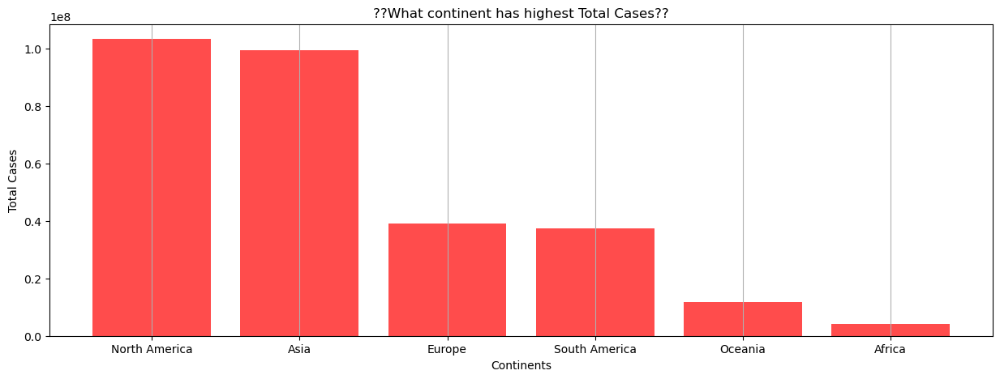

In [66]:
# Vizualization of Total cases by continents

plt.figure(figsize=(15, 5))
plt.bar(cum_total_cases['continent'], cum_total_cases['sum_total_cases'], color='red', alpha=0.7)
#plt.bar(pivot_table['continent'], pivot_table['population'], color='red', alpha=0.7)
plt.xlabel('Continents')
plt.ylabel('Total Cases')
plt.title('??What continent has highest Total Cases??')
plt.grid(axis='x')
plt.show()

In [ ]:
"""
SO I TRIED TO CONFIRM IF TRULY NORTH AMARICA HAD THE HIEST RECORD SO FAR BUT IT WAS INDICATED TO BE ASIA. 
SO I BACK TRACED TO OUr YEARLY TABLE UP AND REALISED THAT EVEN IN 2020, NORTH AMERICA HAD MORE CASES THAN ASIA.
THOUGH THE DIFFERENCE BETWEEN THE TWO CONTINENTS IS ABOUT 4M.
THE PICK IS THAT ASIA-CHINA WAS THE BEGINING OF COVID BUT WE COULD LATER INVESTIGATE BETWEEN NORTH AMERICA AND ASIA COUNTRIES JUST FOR 2020.

BUT WE'LL LOOK AWAY, ASSUMING THIS DATA HAD BEEN TWEAKED OR HAVE SOME ERROR INPUT OR I AM WRONG SOME WHERE. 
PLEASE FEEL FREE TO COMMENT AND POINT IT OUT AND WE'LL LEARN TOGETHER.


"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\1022548101.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? How did the total cases progress over the years in each continent??')

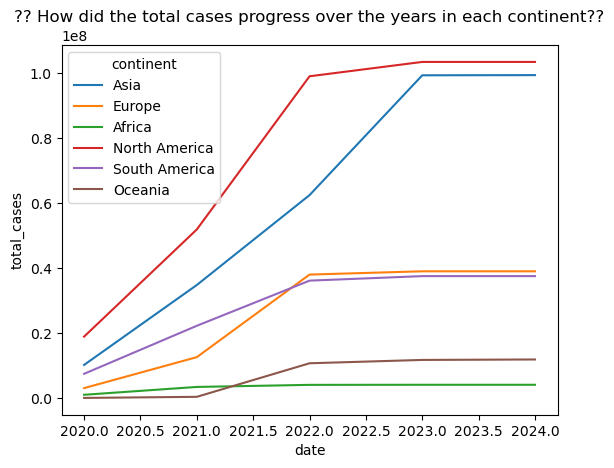

In [67]:
# How cases in each continents progressed over the years

sns.lineplot(data=data,
                x=data['date'].dt.year,
                y='total_cases',
             hue='continent',
             estimator='max',
             ci=None
               ).set_title('?? How did the total cases progress over the years in each continent??')


In [ ]:
"""
So in support of our data table we deducted, we have this plot using max as the estimator aggregator as the parameter.
"""

In [ ]:
"""
Especially in 2022, ASIA and NORTH AMERICA seems to have a significant rise in total cases.
Also it can be seen that from around 2022 there has been approximately no increase in the record meaning the new cases is near 0 for continents like
EUROPE, SOUTH AMERICA, OCEANIA and AFRICA. But ASIA and NORTH AMERICA still struggled till around 2023 before they could contain the outbreak.

You should ask WHY?

"""

In [ ]:
"""
So I'll maerge the population of each continent and the cummulative total cases recorded into a single table so that we can visualize and see better.

"""

In [68]:
cases_by_pop = pd.merge(pivot_table_now,cum_total_cases, on='continent').sort_values(by=['sum_total_cases'], ascending=False)
cases_by_pop

,continent,population,sum_total_cases
3,North America,595352510,103436829.0
0,Asia,4682786577,99373219.0
2,Europe,734789904,38997490.0
4,South America,436508310,37511921.0
5,Oceania,44030306,11861161.0
1,Africa,1296863714,4072765.0


In [69]:
# Saving table above to excel for further investigation
cases_by_pop.to_csv('pivot.csv')

In [70]:
excel_sheet = pd.read_csv('pivot.csv')
excel_sheet

,Unnamed: 0,continent,population,sum_total_cases
0,3,North America,595352510,103436829.0
1,0,Asia,4682786577,99373219.0
2,2,Europe,734789904,38997490.0
3,4,South America,436508310,37511921.0
4,5,Oceania,44030306,11861161.0
5,1,Africa,1296863714,4072765.0


In [ ]:
"""
Looing at this data another way, that is relative to the population of the continents,
OCEANINA seems to be more affected because 1 out of every 4 people were sick and in 
ASIA 1 out of every 48 people were sick.
And of course AFRICA seems relativelhy coolwith 1 out of every 319 people sick.


"""

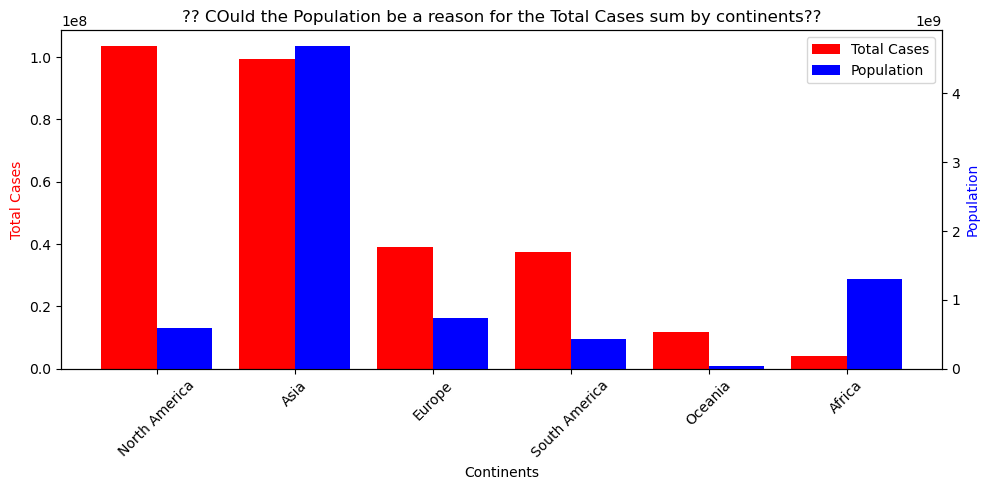

In [71]:
# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('?? COuld the Population be a reason for the Total Cases sum by continents??')

ax2 = ax.twinx()

X_axis = np.arange(len(cases_by_pop['continent']))
ax.bar(X_axis - 0.2, cases_by_pop['sum_total_cases'], 0.4, label = 'Total Cases', color='red')
ax2.bar(X_axis + 0.2, cases_by_pop['population'], 0.4, label = 'Population', color='blue')

ax.set_xticks(X_axis, cases_by_pop['continent'], rotation=45)
ax.set_xlabel('Continents')
ax.set_ylabel('Total Cases', color='red')

ax2.set_ylabel('Population', color='blue')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()

In [ ]:
"""
From above it can be well observed that the population desity of the continents played a role in the number of cases as in ASIA which is reasonable giving that
the COVID started with them. 
But something more attracting is the NORTH AMERICA significantly or exponential cases relative to their population and another thing is AFRICA inverse correlation.

So we'll first check in to ASIA to see what happened then we'll fly to NORTH AMERICA before heading to AFRICA.


"""

In [ ]:
"""



"""

### Investigating into ASIA

In [ ]:
"""
ASIA WE ARE!!!!

First, I want to check how their cases progressed over the years.

"""

In [77]:
# Recall our yearly table

total_cases_by_continent = total_cases_by_continent.reset_index()
total_cases_by_continent

,continent,year_20,year_21,year_22,year_23,year_24
0,Africa,994911.0,3407937.0,4048232.0,4072636.0,4072765.0
1,Asia,10187850.0,34786802.0,62445650.0,99322727.0,99373219.0
2,Europe,3050248.0,12574779.0,37989547.0,38997490.0,38997490.0
3,North America,18890446.0,51878860.0,99019493.0,103436829.0,103436829.0
4,Oceania,28296.0,366607.0,10694041.0,11721535.0,11861161.0
5,South America,7448560.0,22230737.0,36124337.0,37511921.0,37511921.0


In [78]:
# For ASIA alone

total_cases_by_continent[total_cases_by_continent['continent']=='Asia']

,continent,year_20,year_21,year_22,year_23,year_24
1,Asia,10187850.0,34786802.0,62445650.0,99322727.0,99373219.0


<Axes: xlabel='index'>

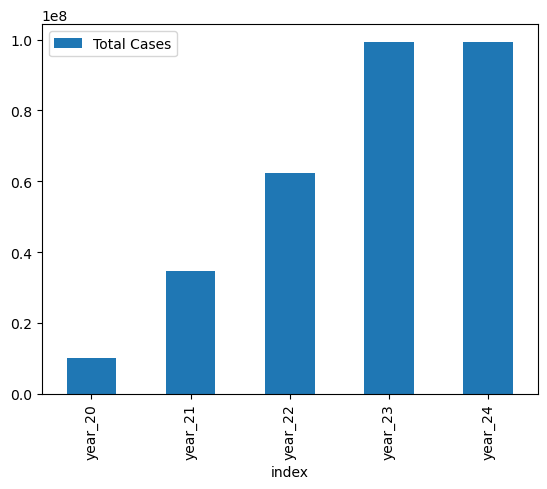

In [79]:
# For ASIA alone

total_cases_by_continent[total_cases_by_continent['continent']=='Asia'].transpose().reset_index().drop(0,axis=0).rename(columns={1:'Total Cases'}).plot(kind='bar',x='index',y=1)

In [80]:
((34786802.0-10187850.0)/10187850.0)*100

241.45381017584674

In [81]:
((62445650.0-34786802.0)/34786802.0)*100

79.50960252109405

In [82]:
((99322727.0-62445650.0)/62445650.0)*100

59.05467714724725

In [83]:
((99373219.0-99322727.0)/99322727.0)*100

0.05083630053774097

In [ ]:
"""
Now we look deeper into the continent to check for the countries in ASIA


I confirmed the countries listed in our data under ASIA and the countries in the real world, we are 3 countries short. 
"""

In [84]:
data_asia = data[data['continent']=='Asia']
data_asia

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426082,YEM,Asia,Yemen,2024-07-31,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426083,YEM,Asia,Yemen,2024-08-01,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426084,YEM,Asia,Yemen,2024-08-02,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426085,YEM,Asia,Yemen,2024-08-03,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457


In [85]:
# Pivot table to see the total cases by continents

pivot_table_asia = data_asia.pivot_table(index=['location'],
                              values=['total_cases','population'],
                              aggfunc='max').reset_index()
pivot_table_asia.sort_values(by='total_cases', ascending=False)


,location,population,total_cases
8,China,1425887360,99373219.0
10,India,1417173120,45041748.0
34,South Korea,51815808,34571873.0
15,Japan,123951696,33803572.0
39,Turkey,85341248,17004718.0
43,Vietnam,98186856,11624000.0
12,Iran,88550568,7627863.0
11,Indonesia,275501344,6829399.0
22,Malaysia,33938216,5309410.0
14,Israel,9449000,4841558.0


In [ ]:
"""
In ASIA China had the highest record, follow by India. But down in the list North Korea and Turkmenistan has 0 record which could account for NORTH AMERICA leading 
ASIA in total cases.

So it is safe to say our data is fair.
"""

In [ ]:
"""
Further more, relative to India that followed China on the table, there is a wdie a wide gap of over 54M cases.
The gap seems too wide, so lets see what happened in China.

"""

In [86]:
data_china = data[data['location']=='China']
data_china

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
73670,CHN,Asia,China,2020-01-05,1.0,1.0,2510.397659,0.0,0.0,22.856527,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
73671,CHN,Asia,China,2020-01-06,1.0,0.0,2510.397659,0.0,0.0,22.856527,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
73672,CHN,Asia,China,2020-01-07,1.0,0.0,2510.397659,0.0,0.0,22.856527,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
73673,CHN,Asia,China,2020-01-08,1.0,0.0,2510.397659,0.0,0.0,22.856527,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
73674,CHN,Asia,China,2020-01-09,1.0,0.0,2510.397659,0.0,0.0,22.856527,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75339,CHN,Asia,China,2024-07-31,99371132.0,0.0,300.429000,122289.0,0.0,1.286000,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
75340,CHN,Asia,China,2024-08-01,99371132.0,0.0,300.429000,122289.0,0.0,1.286000,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
75341,CHN,Asia,China,2024-08-02,99371132.0,0.0,300.429000,122289.0,0.0,1.286000,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457
75342,CHN,Asia,China,2024-08-03,99371132.0,0.0,300.429000,122289.0,0.0,1.286000,...,48.4,51.894546,4.34,76.91,0.761,1425887360,64785.667923,10.252571,11.081299,1867.60457


C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\378021079.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_asia[data_asia['location']=='China'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in China in the these 4 years (total cases??')

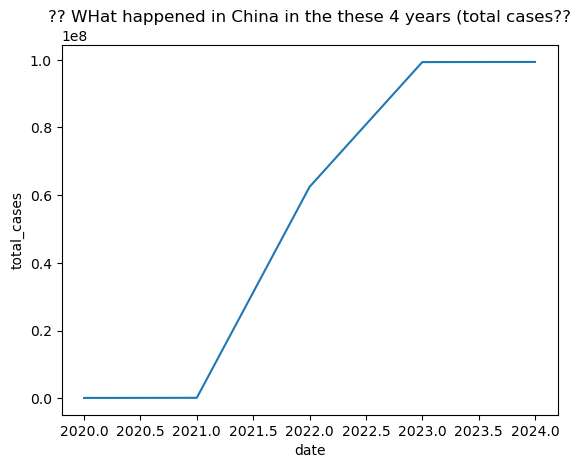

In [89]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_asia[data_asia['location']=='China'],
                x=data_asia['date'].dt.year,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in China in the these 4 years (total cases??')

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\3374676466.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_asia[data_asia['location']=='India'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in India in the these 4 years (total cases??')

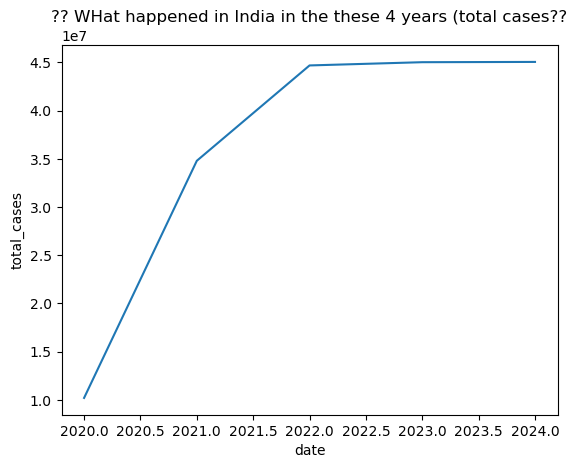

In [91]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_asia[data_asia['location']=='India'],
                x=data_asia['date'].dt.year,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in India in the these 4 years (total cases??')

In [ ]:
"""
Around 2022 to 2023, there was a significant increase in total cases in China. 
Let's see the new cases flow.

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\3433645661.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_china,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? New cases China recorded in these 4 years??')

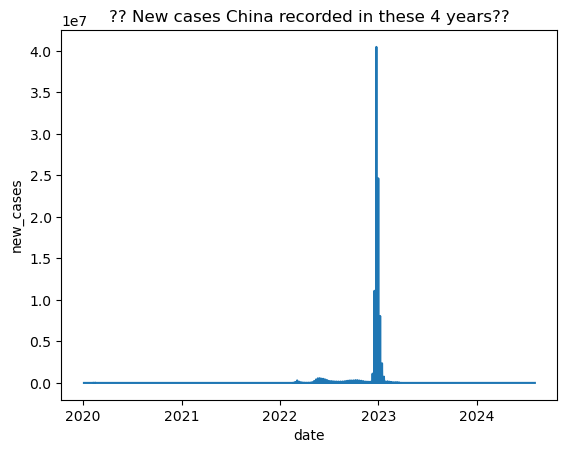

In [92]:
# New cases rate in China

# How cases in each continents progressed over the years

sns.lineplot(data=data_china,
                x=data_china['date'],
                y='new_cases',
#             hue='continent',
#             estimator='sum',
             ci=None
               ).set_title('?? New cases China recorded in these 4 years??')

In [ ]:
"""
2023 seems so much bad in China.

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\1479782706.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='date', ylabel='new_cases'>

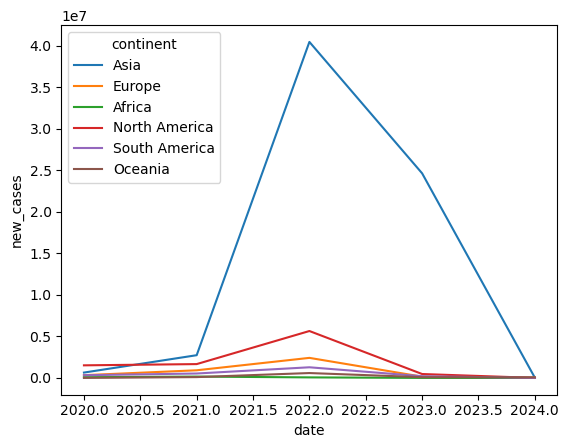

In [93]:
# NEW CASES

sns.lineplot(data=data,
                x=data['date'].dt.year,
                y='new_cases',
             hue='continent',
             estimator='max',
             ci=None
               )

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\391012660.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_china,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? New cases China recorded in the these 4 years??')

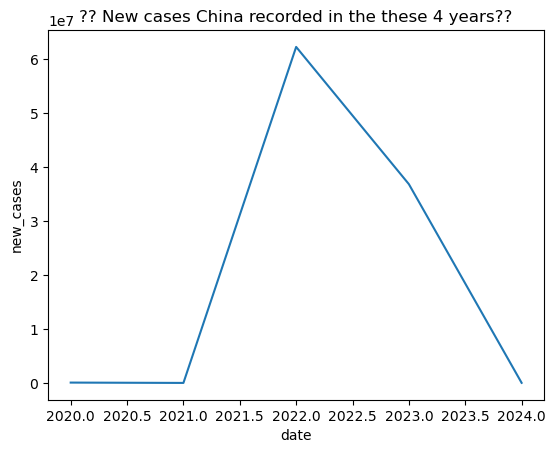

In [94]:
# New cases rate in China

# How cases in each continents progressed over the years

sns.lineplot(data=data_china,
                x=data_china['date'].dt.year,
                y='new_cases',
#             hue='continent',
             estimator='sum',
             ci=None
               ).set_title('?? New cases China recorded in the these 4 years??')

In [ ]:
"""
It was China that increased the new cases erecord of ASIA in 2022 and 2023

"""

In [ ]:
"""
Over laying this immediate plot and the previous one, it shows that every day in 2023, many new cases were recorded but at the end of the year it was not as many as 2022.

We'll check what happened in 2023, why there was higher daily record of new cases.
"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\3026413998.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data[data['location']!='China'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='date', ylabel='new_cases'>

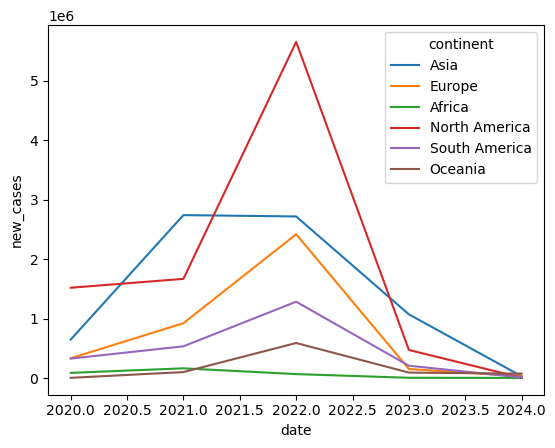

In [95]:
# NEW CASES without CHINA

sns.lineplot(data=data[data['location']!='China'],
                x=data['date'].dt.year,
                y='new_cases',
             hue='continent',
             estimator='max',
             ci=None
               )

In [ ]:
"""
Apparently NORTH AMERICA ALSO HAD A SPIKE IN NEW CASES IN 2022.

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\1468045646.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_china,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? What happended in year 2022 in China??')

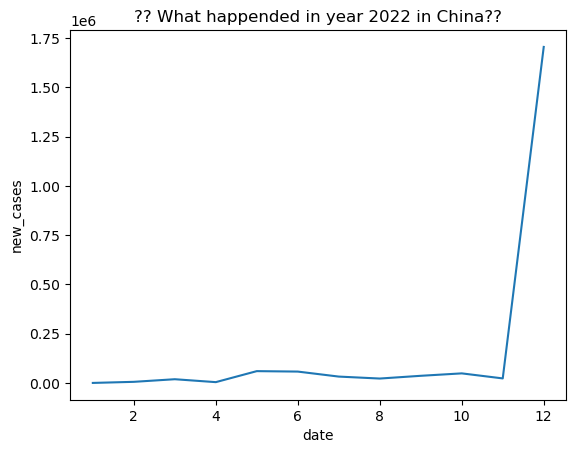

In [96]:
# New cases rate in China

# How cases in each continents progressed over the years

sns.lineplot(data=data_china,
                x=data_china[data_china['date'].dt.year==2022]['date'].dt.month,
                y='new_cases',
#             hue='continent',
#             estimator='sum',
             ci=None
               ).set_title('?? What happended in year 2022 in China??')

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\288144419.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_china,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? What happended in year 2023 in China??')

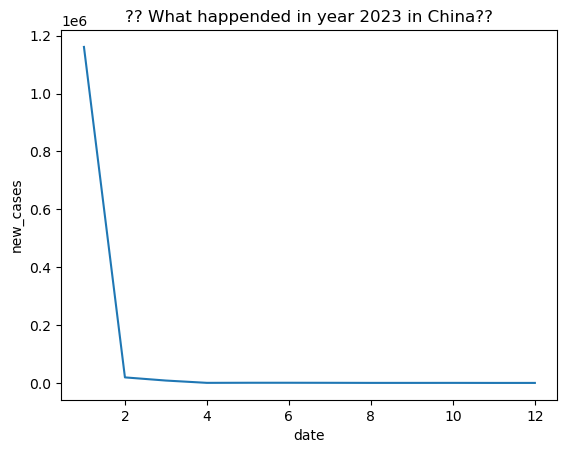

In [97]:
# New cases rate in China

# How cases in each continents progressed over the years

sns.lineplot(data=data_china,
                x=data_china[data_china['date'].dt.year==2023]['date'].dt.month,
                y='new_cases',
#             hue='continent',
#             estimator='sum',
             ci=None
               ).set_title('?? What happended in year 2023 in China??')

In [ ]:
"""
So the most new cases were recorded in December and JAnuary.

December 2022 to January 2023::: Festive periods which most likely there was lot of travelling and gathering which must have increased the numbers of people per square meter,
hence increasing the spread of the virus.
Also, as confirmed, it wad this period there was new variants of COVID which was faster spreading.

Below PLot says it much too.
"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\664135755.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_china,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? New cases China recorded in the months of these 4 years??')

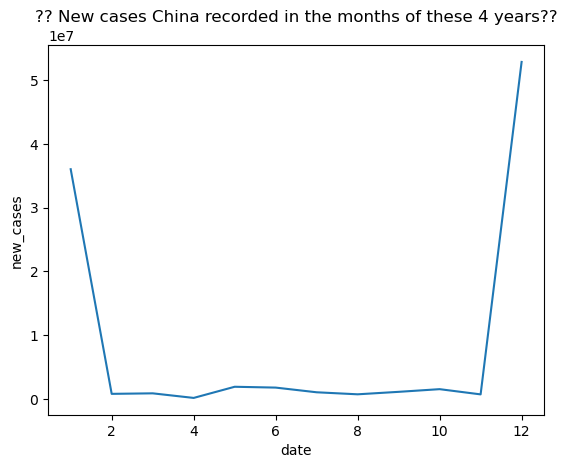

In [98]:
# New cases rate in China

# How cases in each continents progressed over the years

sns.lineplot(data=data_china,
                x=data_china['date'].dt.month,
                y='new_cases',
#             hue='continent',
             estimator='sum',
             ci=None
               ).set_title('?? New cases China recorded in the months of these 4 years??')

In [ ]:
"""
So around December 2022 to January 2023, there was a large increase in the numbers of new caese in China.


You can check the numbers in the table to confirm.

So we can say China caused the high increase in the ASIA record and it was marjorly as December and January.

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\983588013.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_asia[data_asia['location']=='China'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in China in the these 4 years (total death??')

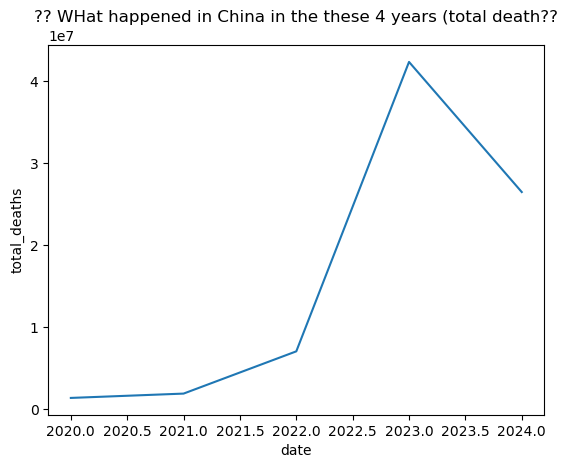

In [99]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_asia[data_asia['location']=='China'],
                x=data_asia['date'].dt.year,
                y='total_deaths',
#             hue='continent',
             estimator='sum',
             ci=None
               ).set_title('?? WHat happened in China in the these 4 years (total death??')

In [ ]:
"""
Mortality rate increase about the same years too, 2022 and 2023.
Shall we check our correlation chart of death cases again.

"""

In [100]:
# CORRELATION FOR ASIA ALONE

corr_list = []

for col in numerical_columns:
    corr_list.append(data_asia['total_deaths'].corr(data_asia[col]))

corr_df = pd.DataFrame(corr_list, numerical_columns.columns, columns=['Correlation Value']).reset_index()

In [101]:
corr_df

,index,Correlation Value
0,total_cases,0.602996
1,new_cases,0.016518
2,new_cases_smoothed,0.043726
3,total_deaths,1.000000
4,new_deaths,0.078338
...,...,...
57,population,0.631206
58,excess_mortality_cumulative_absolute,0.060708
59,excess_mortality_cumulative,0.021877
60,excess_mortality,0.003912


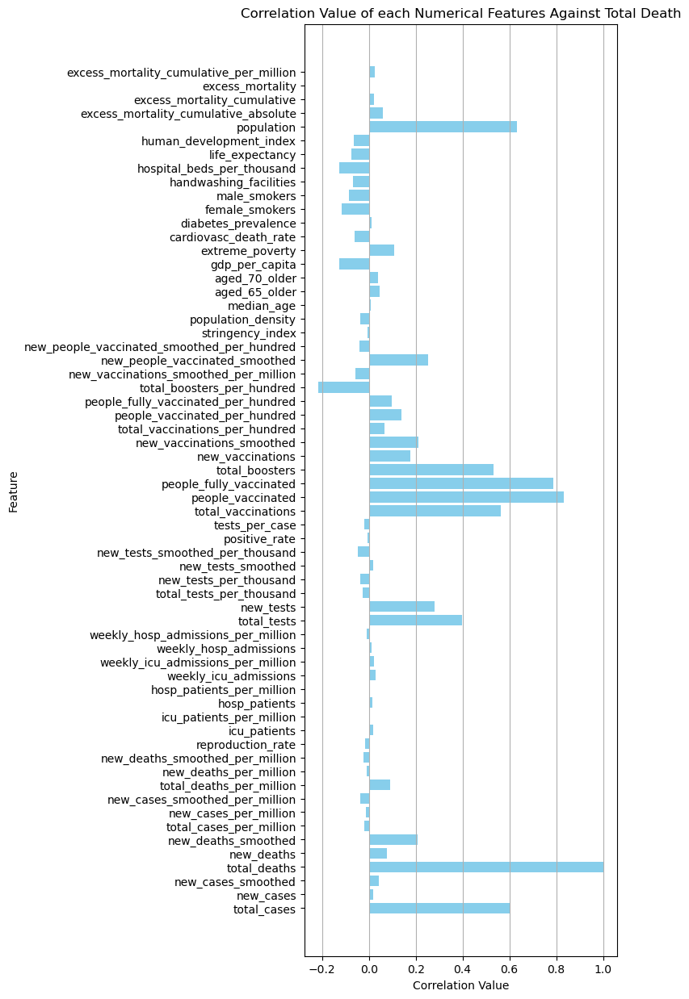

In [102]:
plt.figure(figsize=(5, 15))
plt.barh(numerical_columns.columns, corr_df['Correlation Value'], color='skyblue')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')
plt.title('Correlation Value of each Numerical Features Against Total Death')
plt.grid(axis='x')
plt.show()

In [ ]:
"""
IS IT WORTH NOTHING THE SIGNIFICANT CORRELATION VALUE OF OVER 0.65 BETWEEN TOTAL DEATH IN ASIA AND NUMBERS VACCINATED???

We could check CAUSALITY to confirm that.

"""

In [103]:
# OLS

#data_asia = data_asia[numerical_columns]

data_asia

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,32.655006,37.746,0.5,64.83,0.511,41128772,64785.667923,10.252571,11.081299,1867.60457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426082,YEM,Asia,Yemen,2024-07-31,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426083,YEM,Asia,Yemen,2024-08-01,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426084,YEM,Asia,Yemen,2024-08-02,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457
426085,YEM,Asia,Yemen,2024-08-03,11945.0,0.0,0.000000,2159.0,0.0,0.000000,...,29.200000,49.542,0.7,66.12,0.470,33696612,64785.667923,10.252571,11.081299,1867.60457


In [104]:
# OLS
import statsmodels.api as sm

X = data_asia.drop(['iso_code','continent','location','date','total_deaths','tests_units'], axis=1)
X = sm.add_constant(X)
y = data_asia['total_deaths']

In [105]:
# Split your data set into 80/20 for train/test datasets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)

In [106]:
# create a fitted model & print the summary

y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()

In [107]:
print(lm.summary(xname=list(X.columns)))



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     5361.
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        00:17:56   Log-Likelihood:            -7.0099e+05
No. Observations:               60279   AIC:                         1.402e+06
Df Residuals:                   60217   BIC:                         1.403e+06
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
From above we can see that some variables have effect and some does not but before we try to get insights, let's fine tune the model some bit
by looking at the statistical tests and dropping variables with p-value greater than 0.05.

new_cases
new_cases_smoothed_per_million
new_deaths_per_million 
reproduction_rate 
new_tests_per_thousand
people_vaccinated_per_hundred
people_fully_vaccinated_per_hundred
population_density
aged_65_older
excess_mortality


"""

In [108]:
# OLS
import statsmodels.api as sm

X = data_asia.drop(['iso_code','continent','location','date','total_deaths','tests_units',
                    'new_cases', 'new_cases_smoothed_per_million', 'new_deaths_per_million',
                   'reproduction_rate', 'new_tests_per_thousand', 'people_vaccinated_per_hundred',
                   'people_fully_vaccinated_per_hundred', 'population_density', 'aged_65_older',
                   'excess_mortality'], axis=1)
X = sm.add_constant(X)
y = data_asia['total_deaths']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     6411.
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        00:20:05   Log-Likelihood:            -7.0100e+05
No. Observations:               60279   AIC:                         1.402e+06
Df Residuals:                   60227   BIC:                         1.403e+06
Df Model:                          51                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
Furthermore, 
icu_patients_per_million
"""

In [109]:
# OLS
import statsmodels.api as sm

X = data_asia.drop(['iso_code','continent','location','date','total_deaths','tests_units',
                    'new_cases', 'new_cases_smoothed_per_million', 'new_deaths_per_million',
                   'reproduction_rate', 'new_tests_per_thousand', 'people_vaccinated_per_hundred',
                   'people_fully_vaccinated_per_hundred', 'population_density', 'aged_65_older',
                   'excess_mortality', 'icu_patients_per_million'], axis=1)
X = sm.add_constant(X)
y = data_asia['total_deaths']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     6539.
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        00:21:21   Log-Likelihood:            -7.0101e+05
No. Observations:               60279   AIC:                         1.402e+06
Df Residuals:                   60228   BIC:                         1.403e+06
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

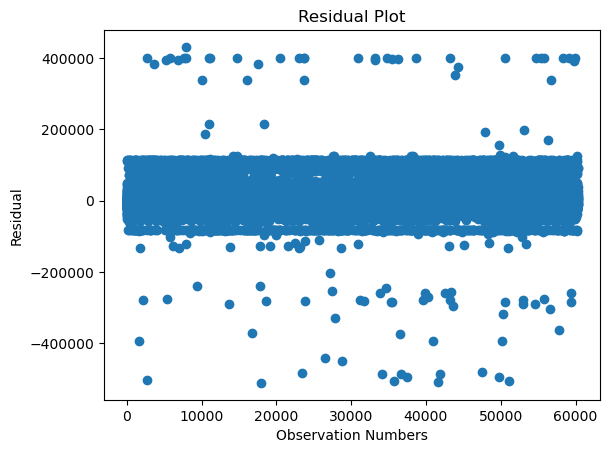

(array([1.4000e+01, 7.0000e+00, 3.0000e+01, 1.0000e+00, 8.4900e+02,
        5.7693e+04, 1.6400e+03, 7.0000e+00, 0.0000e+00, 3.8000e+01]),
 array([-510871.33853117, -416705.10981711, -322538.88110304,
        -228372.65238897, -134206.4236749 ,  -40040.19496084,
          54126.03375323,  148292.2624673 ,  242458.49118136,
         336624.71989543,  430790.9486095 ]),
 <BarContainer object of 10 artists>)

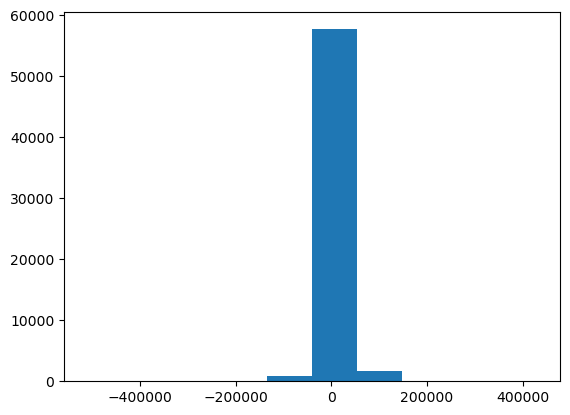

In [333]:
# plot to check homoscedasticity  and Normality
plt.plot(lm.resid,'o')
plt.title('Residual Plot')
plt.ylabel('Residual')
plt.xlabel('Observation Numbers')
plt.show()
plt.hist(lm.resid,)
#plt.hist()

In [ ]:
"""
With the most Residual plot as along a straight, we can say it's quite safe to draw conclusion from this model.
Our Durbin-Watson almost 2 shows no autocorrelation but our Condition no. too high shows possibility of multicollinearity
which is quite fair because some predictors are just ratio of another.

"""

In [ ]:
"""
With our model accuracy up tp .84 and no redundant variable or p-value greater than .05.
We can look at the coefficient and pick some variables that stands out.

Since we are trying to look at the variables that contributed to increase in the death rate, so we'll pick predictors with
positive coefficients instead.

new_deaths_smoothed                           26.2762
total_deaths_per_million                      15.6636
weekly_icu_admissions                        140.6659
weekly_hosp_admissions_per_million           106.8204
new_tests                                      0.0121      
total_tests_per_thousand                       0.8269
positive_rate                               1.149e+04
tests_per_case                                 0.0490
people_vaccinated                              0.0004
new_vaccinations_smoothed                      0.0050
total_boosters_per_hundred                   274.3696
new_people_vaccinated_smoothed                 0.0186
extreme_poverty                               71.3654
human_development_index                     1.813e+05
population                                  3.354e-05
excess_mortality_cumulative                  499.3267



PS::: Do you know how to automatically get the variables out without manually copying. lol. I am lazy. 
please let me know.
"""

In [ ]:
"""
For me, what stands out most are

extreme_poverty                               71.3654
human_development_index                     1.813e+05
total_boosters_per_hundred                   274.3696

Others seems to be CASUALITY EFFECT!


"""

In [111]:
# Pivot table to see the total cases by continents
indicators = ['population','total_cases','total_deaths','extreme_poverty',
           'human_development_index','total_boosters_per_hundred']

pivot_all = data_asia.pivot_table(index=['location'],
                              values=indicators,
                              aggfunc='max').reset_index()
pivot_all.sort_values(by='total_deaths', ascending=False)


,location,extreme_poverty,human_development_index,population,total_boosters_per_hundred,total_cases,total_deaths
10,India,21.200000,0.645000,1417173120,36.983361,45041748.0,533623.0
11,Indonesia,5.700000,0.718000,275501344,36.983361,6829399.0,162059.0
12,Iran,0.200000,0.783000,88550568,36.983361,7627863.0,146837.0
8,China,0.700000,0.761000,1425887360,57.990000,99373219.0,122304.0
39,Turkey,0.200000,0.820000,85341248,48.540000,17004718.0,101419.0
15,Japan,13.128331,0.919000,123951696,141.720000,33803572.0,74694.0
30,Philippines,13.128331,0.718000,115559008,36.983361,4173631.0,66864.0
43,Vietnam,2.000000,0.704000,98186856,59.050000,11624000.0,43206.0
22,Malaysia,0.100000,0.810000,33938216,50.640000,5309410.0,37351.0
34,South Korea,0.200000,0.916000,51815808,79.760000,34571873.0,35934.0


In [119]:
# TOP 5 by death cases

top_5 = pivot_all.sort_values(by='total_deaths', ascending=False).head()
top_5

,location,extreme_poverty,human_development_index,population,total_boosters_per_hundred,total_cases,total_deaths
10,India,21.2,0.645,1417173120,36.983361,45041748.0,533623.0
11,Indonesia,5.7,0.718,275501344,36.983361,6829399.0,162059.0
12,Iran,0.2,0.783,88550568,36.983361,7627863.0,146837.0
8,China,0.7,0.761,1425887360,57.990000,99373219.0,122304.0
39,Turkey,0.2,0.820,85341248,48.540000,17004718.0,101419.0


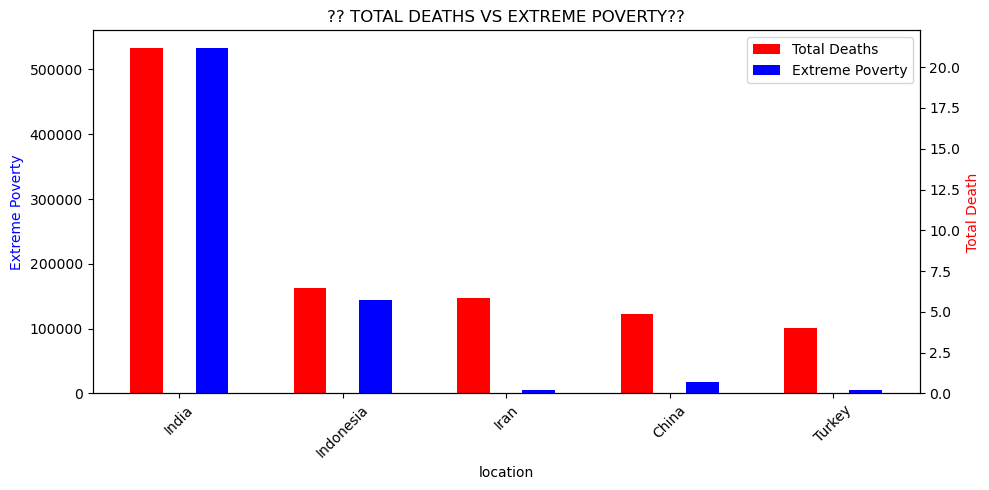

In [137]:
# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('?? TOTAL DEATHS VS EXTREME POVERTY??')

ax2 = ax.twinx()


X_axis = np.arange(len(top_5['location']))
ax.bar(X_axis - 0.2, top_5['total_deaths'], 0.2, label = 'Total Deaths', color='red')
ax2.bar(X_axis + 0.2, top_5['extreme_poverty'], 0.2, label = 'Extreme Poverty', color='blue')


ax.set_xticks(X_axis, top_5['location'], rotation=45)
ax.set_xlabel('location')
ax.set_ylabel('Extreme Poverty', color='blue')

ax2.set_ylabel('Total Death', color='red')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()

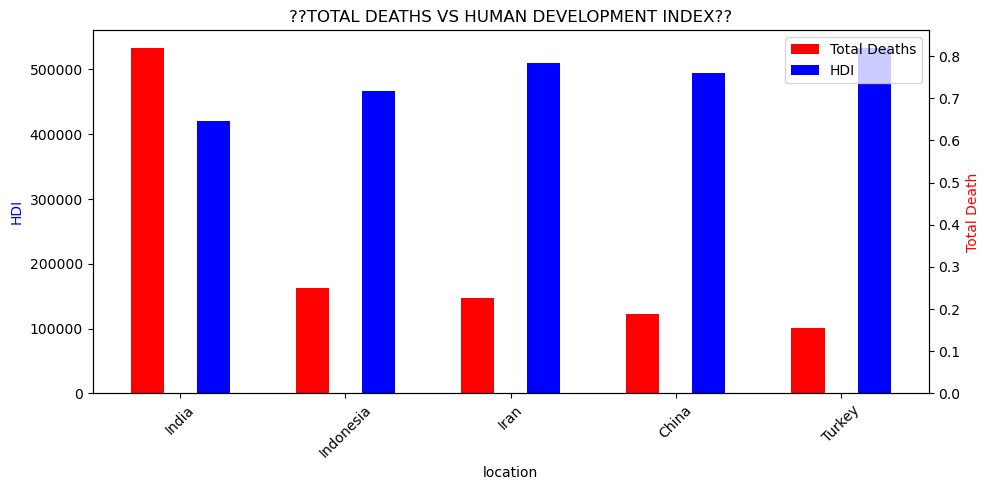

In [138]:
# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('??TOTAL DEATHS VS HUMAN DEVELOPMENT INDEX??')

ax2 = ax.twinx()


X_axis = np.arange(len(top_5['location']))
ax.bar(X_axis - 0.2, top_5['total_deaths'], 0.2, label = 'Total Deaths', color='red')
ax2.bar(X_axis + 0.2, top_5['human_development_index'], 0.2, label = 'HDI', color='blue')


ax.set_xticks(X_axis, top_5['location'], rotation=45)
ax.set_xlabel('location')
ax.set_ylabel('HDI', color='blue')

ax2.set_ylabel('Total Death', color='red')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()


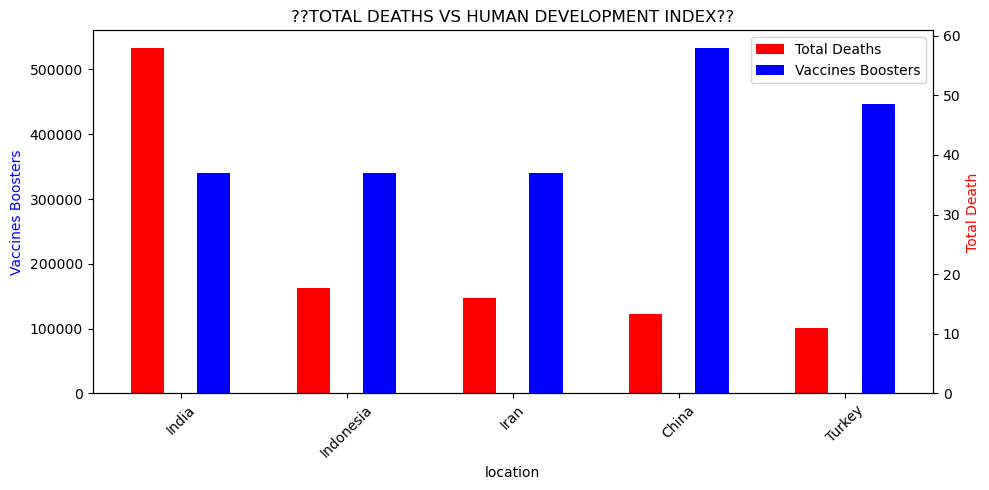

In [139]:
# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('??TOTAL DEATHS VS HUMAN DEVELOPMENT INDEX??')

ax2 = ax.twinx()


X_axis = np.arange(len(top_5['location']))
ax.bar(X_axis - 0.2, top_5['total_deaths'], 0.2, label = 'Total Deaths', color='red')
ax2.bar(X_axis + 0.2, top_5['total_boosters_per_hundred'], 0.2, label = 'Vaccines Boosters', color='blue')


ax.set_xticks(X_axis, top_5['location'], rotation=45)
ax.set_xlabel('location')
ax.set_ylabel('Vaccines Boosters', color='blue')

ax2.set_ylabel('Total Death', color='red')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()


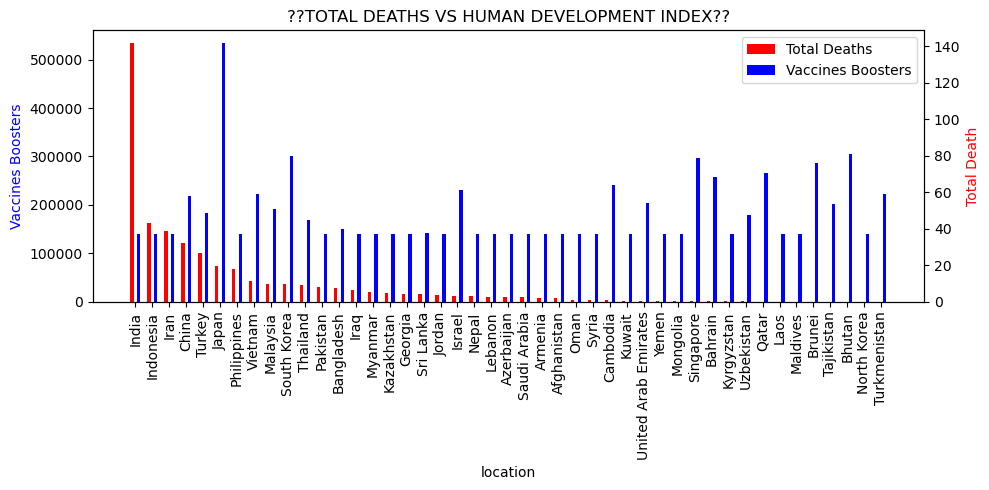

In [142]:
# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('??TOTAL DEATHS VS HUMAN DEVELOPMENT INDEX??')

ax2 = ax.twinx()


X_axis = np.arange(len(pivot_all.sort_values(by='total_deaths', ascending=False)['location']))
ax.bar(X_axis - 0.2, pivot_all.sort_values(by='total_deaths', ascending=False)['total_deaths'], 0.2, label = 'Total Deaths', color='red')
ax2.bar(X_axis + 0.2, pivot_all.sort_values(by='total_deaths', ascending=False)['total_boosters_per_hundred'], 0.2, label = 'Vaccines Boosters', color='blue')


ax.set_xticks(X_axis, pivot_all.sort_values(by='total_deaths', ascending=False)['location'], rotation=90)
ax.set_xlabel('location')
ax.set_ylabel('Vaccines Boosters', color='blue')

ax2.set_ylabel('Total Death', color='red')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()


In [354]:
"""

Though China had the higest cases,they only fall as 4th position in total death cases as India has the highest death in ASIA.

India has the second index in extreme poverty with measure of 21 and Laos with highest of 22 sits on far below in the number of death cases. 
So we can say Poverty contributed to India high rate of death coupled with thier high total cases. But that seems to be contrary to their over rthe average HDI.
This shows that India didn't handle the crisis as comparedto China definitaely not because of HDI but because of poverty. China had much more cases than they do but 
was able to prevent death.

India has the second population, second largest total casers, definitly the population affected how quick they were able to ocntain the outbreak. But given their poverty
rating, it seems otherwise. Wth India second ranking in poverty means that they most likely lacked proper health facilities and cares to quickly savaged the out break.

Speaking of advantages, low population, high HDI number and low extreme poverty measure, IRAN still managed to have higher death number than China,
which shows a subtle space for other factors not recorded like government policies and the masses reaction and compliances.



"""

''

### Investigating into NORTH AMAERICA

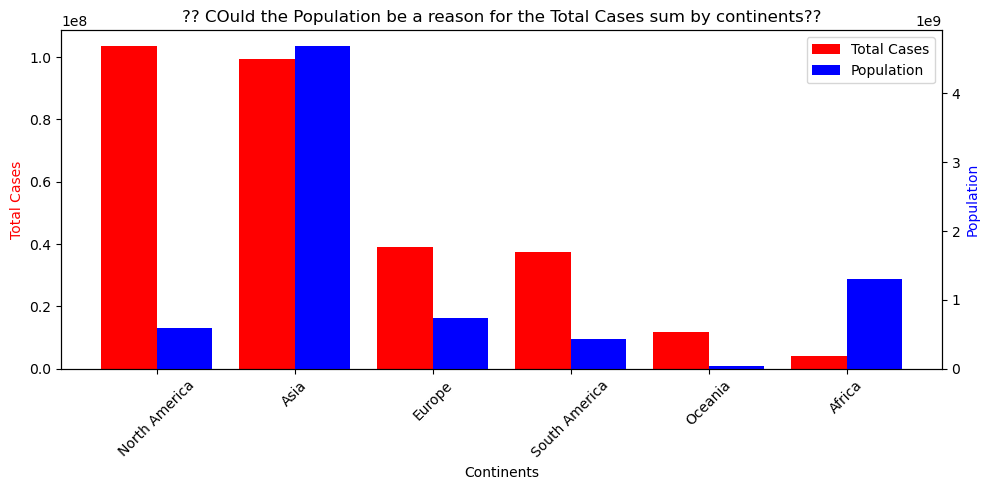

In [143]:
# RECALL PLOT


# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('?? COuld the Population be a reason for the Total Cases sum by continents??')

ax2 = ax.twinx()

X_axis = np.arange(len(cases_by_pop['continent']))
ax.bar(X_axis - 0.2, cases_by_pop['sum_total_cases'], 0.4, label = 'Total Cases', color='red')
ax2.bar(X_axis + 0.2, cases_by_pop['population'], 0.4, label = 'Population', color='blue')

ax.set_xticks(X_axis, cases_by_pop['continent'], rotation=45)
ax.set_xlabel('Continents')
ax.set_ylabel('Total Cases', color='red')

ax2.set_ylabel('Population', color='blue')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()

<Axes: xlabel='index'>

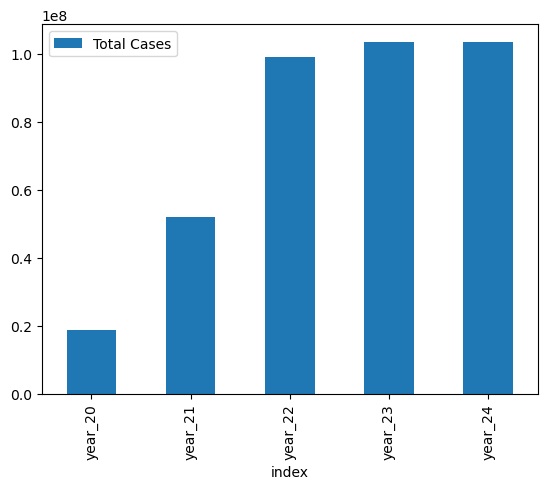

In [144]:
# For NOth America alone

total_cases_by_continent[total_cases_by_continent['continent']=='North America'].transpose().reset_index().drop(0,axis=0).rename(columns={3:'Total Cases'}).plot(kind='bar',x='index',y=1)

In [ ]:
"""
We can see thaty NORTH AMARICA also has a spike in total cases in 2022 before being able to control the outbreak.
"""

In [145]:
data_north = data[data['continent']=='North America']
data_north

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
13392,ATG,North America,Antigua and Barbuda,2020-01-05,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,32.655006,51.894546,3.80,77.02,0.778,93772,64785.667923,10.252571,11.081299,1867.60457
13393,ATG,North America,Antigua and Barbuda,2020-01-06,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,32.655006,51.894546,3.80,77.02,0.778,93772,64785.667923,10.252571,11.081299,1867.60457
13394,ATG,North America,Antigua and Barbuda,2020-01-07,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,32.655006,51.894546,3.80,77.02,0.778,93772,64785.667923,10.252571,11.081299,1867.60457
13395,ATG,North America,Antigua and Barbuda,2020-01-08,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,32.655006,51.894546,3.80,77.02,0.778,93772,64785.667923,10.252571,11.081299,1867.60457
13396,ATG,North America,Antigua and Barbuda,2020-01-09,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,32.655006,51.894546,3.80,77.02,0.778,93772,64785.667923,10.252571,11.081299,1867.60457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405120,USA,North America,United States,2024-07-31,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.600000,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.60457
405121,USA,North America,United States,2024-08-01,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.600000,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.60457
405122,USA,North America,United States,2024-08-02,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.600000,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.60457
405123,USA,North America,United States,2024-08-03,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.600000,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.60457


In [146]:
# Pivot table to see the total cases by continents

pivot_table_north = data_north.pivot_table(index=['location'],
                              values=['total_cases','population'],
                              aggfunc='max').reset_index()
pivot_table_north.sort_values(by='total_cases', ascending=False)


,location,population,total_cases
20,United States,338289856,103436829.0
15,Mexico,127504120,7619458.0
4,Canada,38454328,4819055.0
11,Guatemala,17843914,1250371.0
5,Costa Rica,5180836,1234701.0
6,Cuba,11212198,1113662.0
17,Panama,4408582,1044821.0
8,Dominican Republic,11228821,661103.0
13,Honduras,10432858,472896.0
9,El Salvador,6336393,201920.0


In [ ]:
"""
United states has the highest population and highest total cases.
"""

In [ ]:
"""
So what happened in USA???
"""

In [148]:
data_usa = data_north[data_north['location']=='United States']
data_usa

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
403451,USA,North America,United States,2020-01-05,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,-1914.900000,-3.090000,-3.090000,-5.700091
403452,USA,North America,United States,2020-01-06,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403453,USA,North America,United States,2020-01-07,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403454,USA,North America,United States,2020-01-08,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403455,USA,North America,United States,2020-01-09,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405120,USA,North America,United States,2024-07-31,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405121,USA,North America,United States,2024-08-01,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405122,USA,North America,United States,2024-08-02,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405123,USA,North America,United States,2024-08-03,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570


C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\3984615277.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa[data_usa['location']=='United States'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in United States in the these 4 years (total cases??')

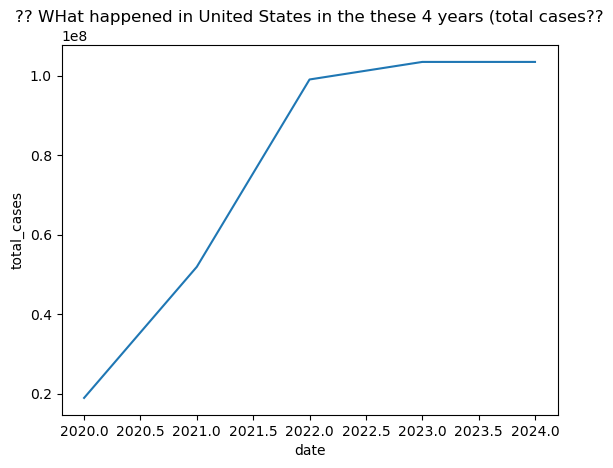

In [150]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_usa[data_usa['location']=='United States'],
                x=data_usa['date'].dt.year,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in United States in the these 4 years (total cases??')

In [ ]:
"""
Again in USA, there was a rise in 2021 and 2022 as we can see from the plot above.
Let's see what happened in the year 2021

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\2089035710.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa[data_usa['location']=='United States'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in United States in the these 2021 years (total cases??')

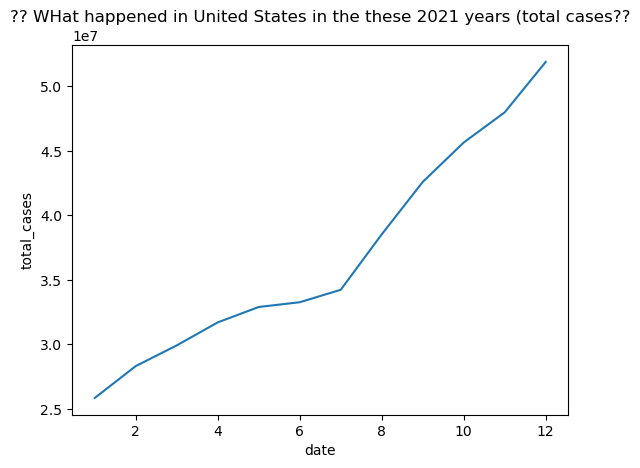

In [154]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_usa[data_usa['location']=='United States'],
                x=data_usa[data_usa['date'].dt.year==2021]['date'].dt.month,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in United States in the these 2021 years (total cases??')

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\536285881.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa[data_usa['location']=='United States'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in United States in the these 2022 (total cases??')

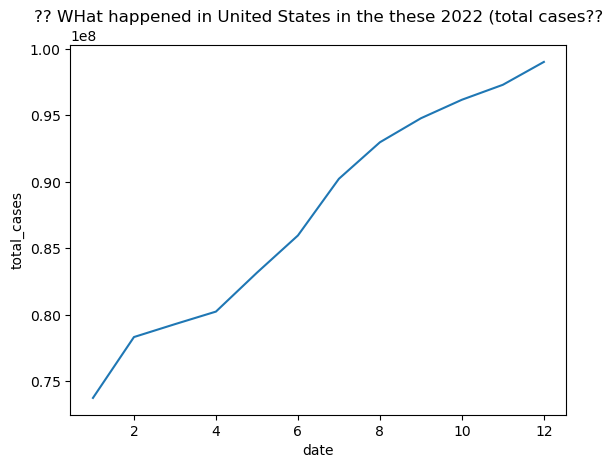

In [155]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_usa[data_usa['location']=='United States'],
                x=data_usa[data_usa['date'].dt.year==2022]['date'].dt.month,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in United States in the these 2022 (total cases??')

In [ ]:
"""
There was rather a steady rise of total cases in USA in 2022 to 2023
"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\2329416879.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? New cases United States recorded in the these 4 years??')

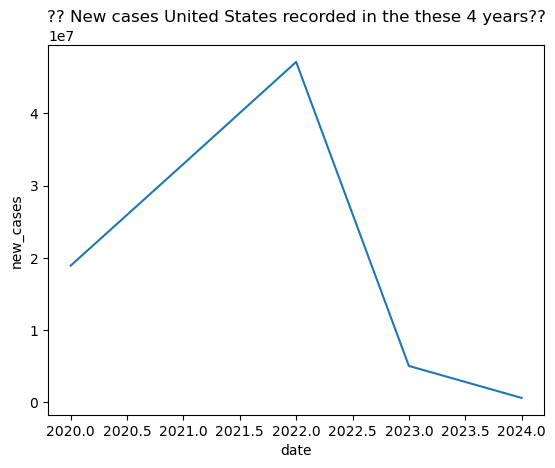

In [156]:
# New cases rate in United states

# How cases in each continents progressed over the years

sns.lineplot(data=data_usa,
                x=data_usa['date'].dt.year,
                y='new_cases',
#             hue='continent',
             estimator='sum',
             ci=None
               ).set_title('?? New cases United States recorded in the these 4 years??')

In [ ]:
"""
2022 seems to be the highest spike of new cases in USA.
"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\706277533.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa[data_usa['location']=='United States'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in United States in the these 2021 (NEW cases??')

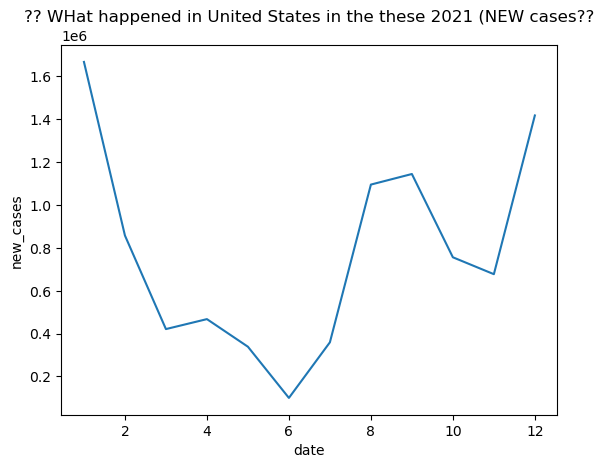

In [158]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_usa[data_usa['location']=='United States'],
                x=data_usa[data_usa['date'].dt.year==2021]['date'].dt.month,
                y='new_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in United States in the these 2021 (NEW cases??')

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\997000894.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_usa[data_usa['location']=='United States'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in United States in the these 2022 (NEW cases??')

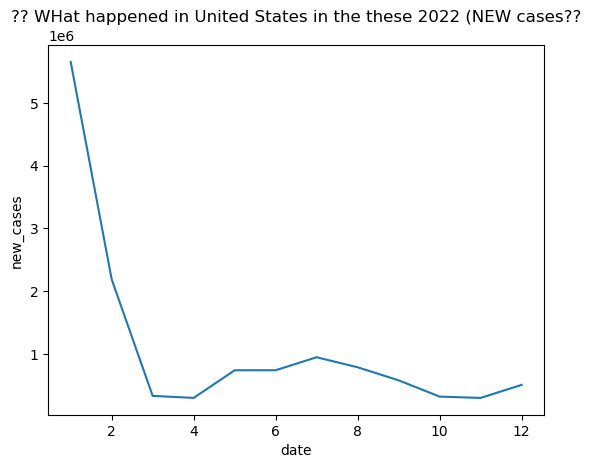

In [157]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_usa[data_usa['location']=='United States'],
                x=data_usa[data_usa['date'].dt.year==2022]['date'].dt.month,
                y='new_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in United States in the these 2022 (NEW cases??')

In [ ]:
"""
Starting from mid year 2021 to the end of the year, new cases were recorded. 
From 2022 January, the new cases record declined.

WHY??
Following the decline in new cases from begining of the year, I guess the socail distancing policy and nose mask was relaxed.
Also the new variant was hitting high too at this period.


"""

In [160]:
#Pivot table to see the total deaths in NORTH AMERICA

pivot_table_north = data_north.pivot_table(index=['location'],
                              values=['total_deaths','population'],
                              aggfunc='max').reset_index()
pivot_table_north.sort_values(by='total_deaths', ascending=False)

,location,population,total_deaths
20,United States,338289856,1193165.0
15,Mexico,127504120,334551.0
4,Canada,38454328,55282.0
11,Guatemala,17843914,20203.0
13,Honduras,10432858,11114.0
5,Costa Rica,5180836,9372.0
17,Panama,4408582,8748.0
6,Cuba,11212198,8530.0
19,Trinidad and Tobago,1531043,4390.0
8,Dominican Republic,11228821,4384.0


In [ ]:
"""
US loves top board...lol..
Highest total cases, highest death cases too both in North America and in the world.


So I'll be investigating their toal_cases and _total_deaths, trying to see if we can pick some pridictors.

"""

In [178]:
# Starting with Correlation of TOTAL CASES

# CORRELATION FOR United States alone

corr_list = []

for col in numerical_columns:
    corr_list.append(data_usa['total_cases'].corr(data_usa[col]))

corr_df = pd.DataFrame(corr_list, numerical_columns.columns, columns=['Correlation Value']).reset_index()

C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [179]:
corr_df

,index,Correlation Value
0,total_cases,1.000000
1,new_cases,-0.051436
2,new_cases_smoothed,-0.156821
3,total_deaths,0.983652
4,new_deaths,-0.134387
...,...,...
57,population,NaN
58,excess_mortality_cumulative_absolute,0.138194
59,excess_mortality_cumulative,0.099079
60,excess_mortality,-0.152951


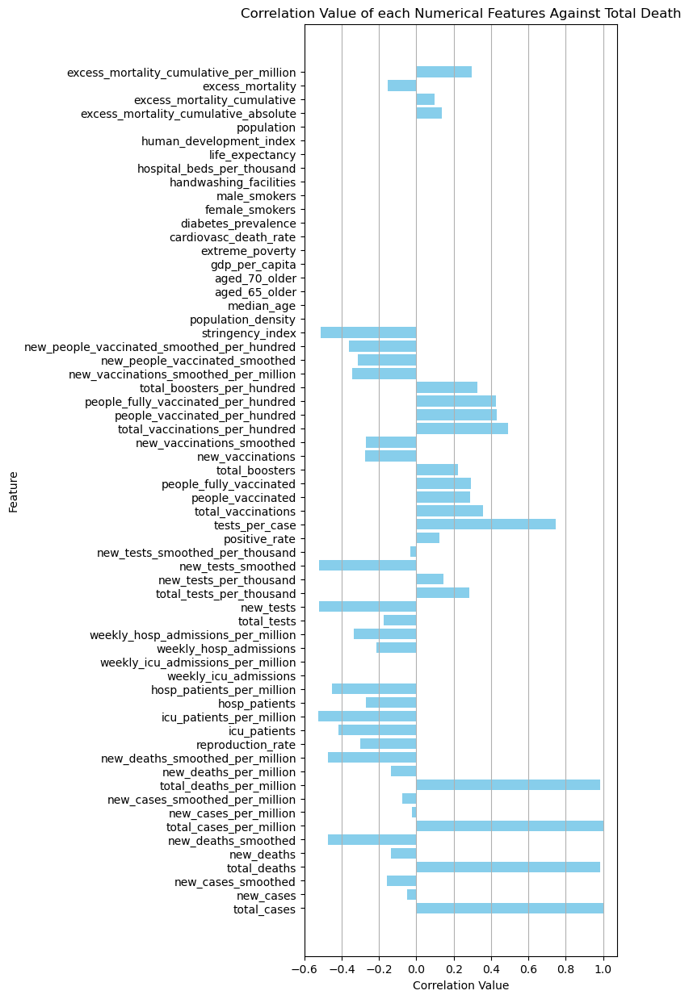

In [180]:
plt.figure(figsize=(5, 15))
plt.barh(numerical_columns.columns, corr_df['Correlation Value'], color='skyblue')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')
plt.title('Correlation Value of each Numerical Features Against Total Death')
plt.grid(axis='x')
plt.show()

In [ ]:
"""
Some variables do not have a corre;ation value because we had RUntimeWarninbg while calculating our correlation value,
which means some calculation resulted in divisor equals 0.

So we'll progress with OLS

"""

In [181]:
data_usa

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
403451,USA,North America,United States,2020-01-05,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,-1914.900000,-3.090000,-3.090000,-5.700091
403452,USA,North America,United States,2020-01-06,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403453,USA,North America,United States,2020-01-07,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403454,USA,North America,United States,2020-01-08,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
403455,USA,North America,United States,2020-01-09,0.0,0.000000,2510.397659,0.0,0.0,22.856527,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405120,USA,North America,United States,2024-07-31,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405121,USA,North America,United States,2024-08-01,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405122,USA,North America,United States,2024-08-02,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570
405123,USA,North America,United States,2024-08-03,103436829.0,2502.989441,2510.397659,1192546.0,0.0,88.429000,...,24.6,51.894546,2.77,78.86,0.926,338289856,64785.667923,10.252571,11.081299,1867.604570


In [183]:
# OLS
import statsmodels.api as sm

X = data_usa.drop(['iso_code','continent','location','date','tests_units','total_cases'], axis=1)
X = sm.add_constant(X)
y = data_usa['total_cases']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.551e+16
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        15:08:40   Log-Likelihood:                -2647.7
No. Observations:                1339   AIC:                             5385.
Df Residuals:                    1294   BIC:                             5619.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
Droping variables with p-value greater than .05


Dropping all features except::::

total_cases_per_million
new_vaccinations_smoothed
new_vaccinations_smoothed_per_million
new_people_vaccinated_smoothed
new_people_vaccinated_smoothed_per_hundred

"""

In [188]:
# OLS
import statsmodels.api as sm

X = data_usa.drop(['iso_code','continent','location','date','tests_units','total_cases'], axis=1)[[
                    'total_cases_per_million','new_vaccinations_smoothed','new_vaccinations_smoothed_per_million',
                    'new_people_vaccinated_smoothed','new_people_vaccinated_smoothed_per_hundred'
]]

X = sm.add_constant(X)
y = data_usa['total_cases']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.352e+17
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        15:26:21   Log-Likelihood:                -2673.9
No. Observations:                1339   AIC:                             5360.
Df Residuals:                    1333   BIC:                             5391.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
Of all the features left, we have the positive features:::

total_cases_per_million                      341.5340. This feature is just a multiple of our total_cases variable, so it is not mean much.

new_people_vaccinated_smoothed_per_hundred  1099.4922


So we'll plot new_people_vaccinated_smoothed_per_hundred  and total_cases side by side
"""

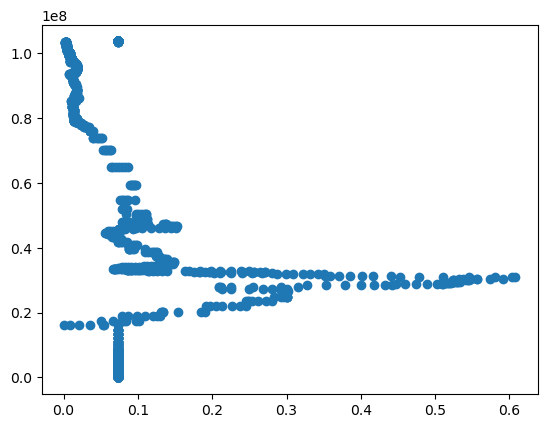

In [211]:
plt.scatter(x = data_usa['new_people_vaccinated_smoothed_per_hundred'],
           y = data_usa['total_cases'])

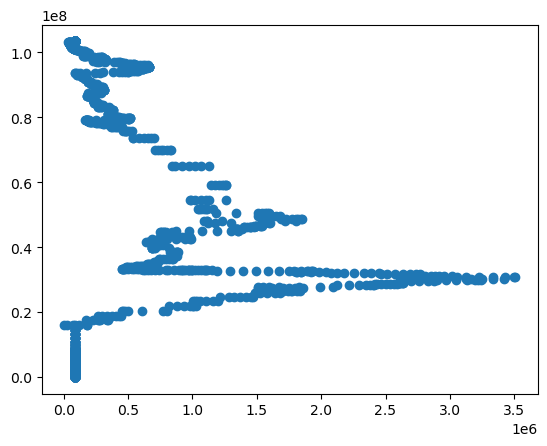

In [213]:
plt.scatter(x = data_usa['new_vaccinations_smoothed'],
           y = data_usa['total_cases'])

In [ ]:
"""
Somthing about the pattern of these plots indicates that at some period the vaccine had a positive slope with the total cases and at another time
it had a negative slope.



"""

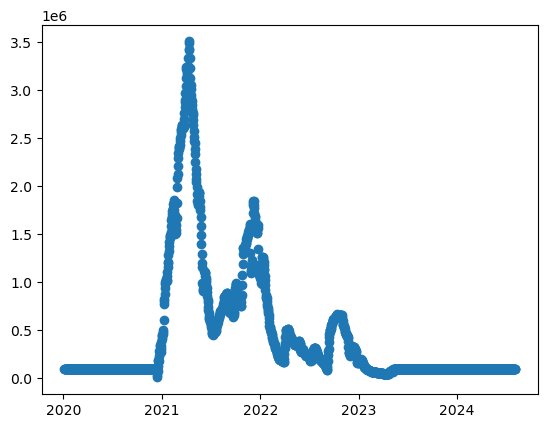

In [214]:
plt.scatter(x = data_usa['date'],
           y = data_usa['new_vaccinations_smoothed'])

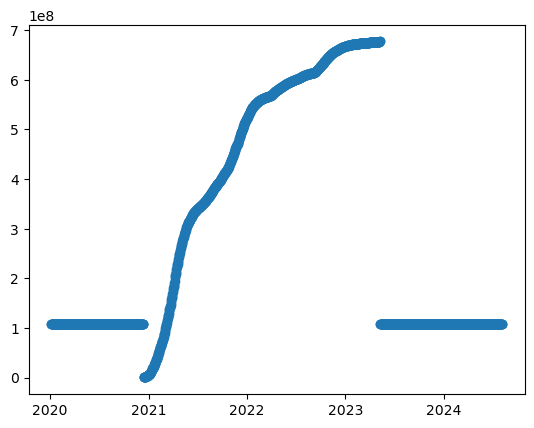

In [215]:
plt.scatter(x = data_usa['date'],
           y = data_usa['total_vaccinations'])

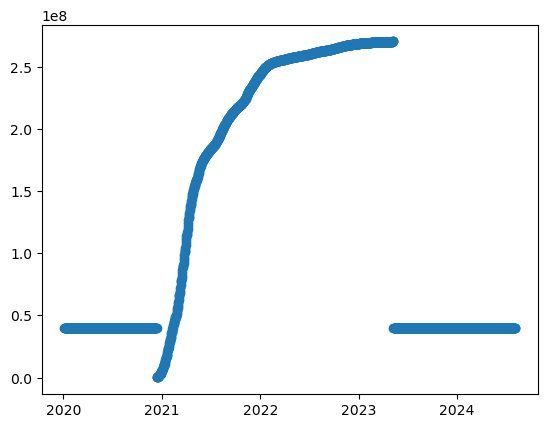

In [216]:
plt.scatter(x = data_usa['date'],
           y = data_usa['people_vaccinated'])

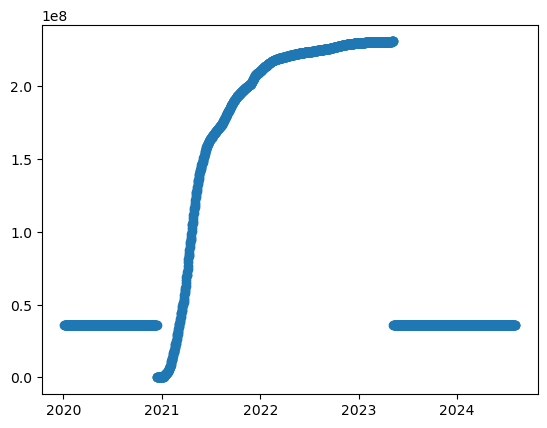

In [217]:
plt.scatter(x = data_usa['date'],
           y = data_usa['people_fully_vaccinated'])

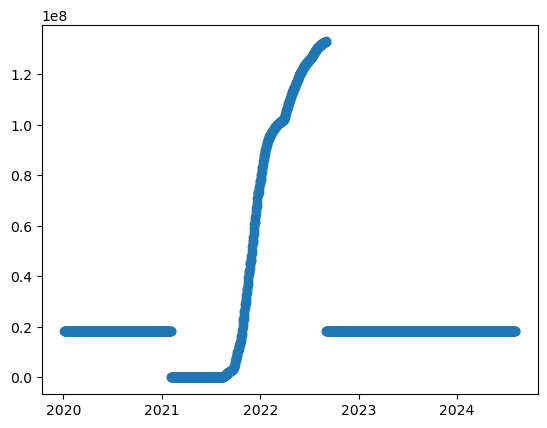

In [218]:
plt.scatter(x = data_usa['date'],
           y = data_usa['total_boosters'])

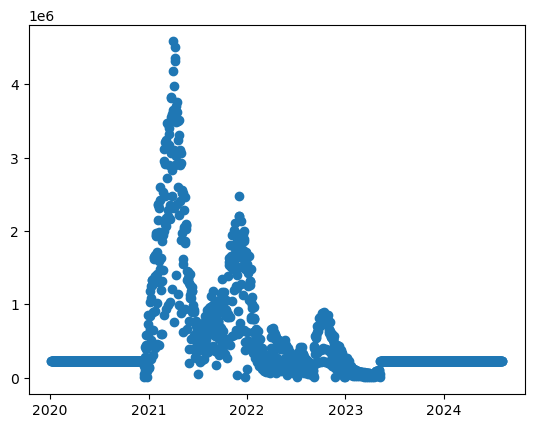

In [219]:
plt.scatter(x = data_usa['date'],
           y = data_usa['new_vaccinations'])

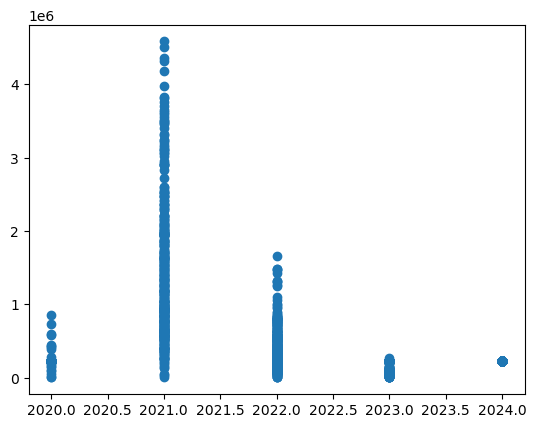

In [225]:
plt.scatter(x = data_usa['date'].dt.year,
           y = data_usa['new_vaccinations'])

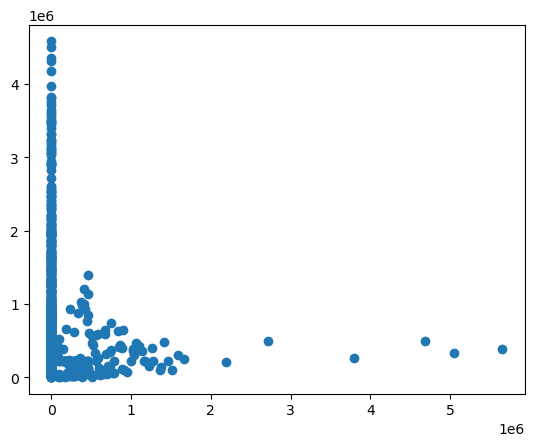

In [226]:
plt.scatter(x = data_usa['new_cases'],
           y = data_usa['new_vaccinations'])

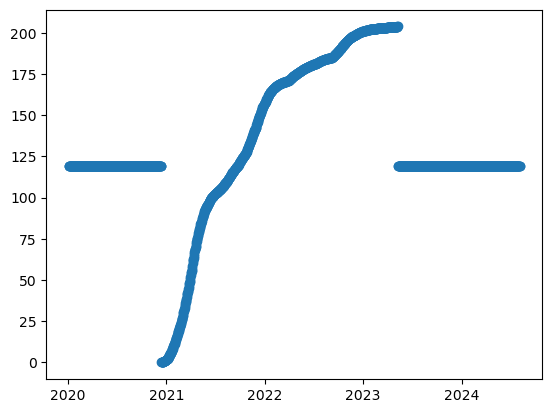

In [220]:
plt.scatter(x = data_usa['date'],
           y = data_usa['total_vaccinations_per_hundred'])

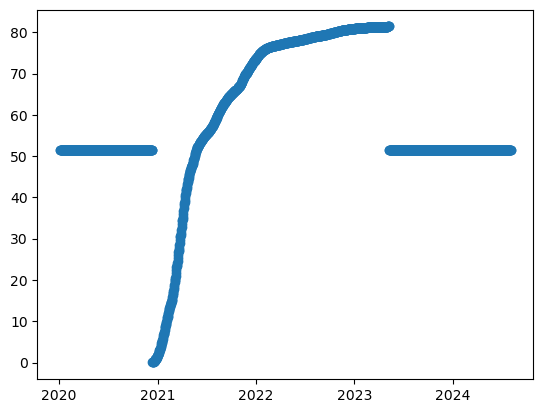

In [221]:
plt.scatter(x = data_usa['date'],
           y = data_usa['people_vaccinated_per_hundred'])

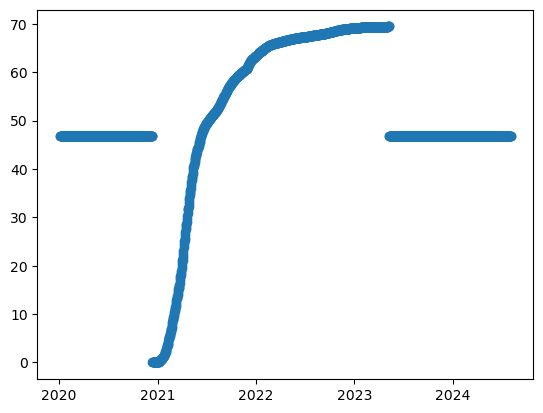

In [222]:
plt.scatter(x = data_usa['date'],
           y = data_usa['people_fully_vaccinated_per_hundred'])

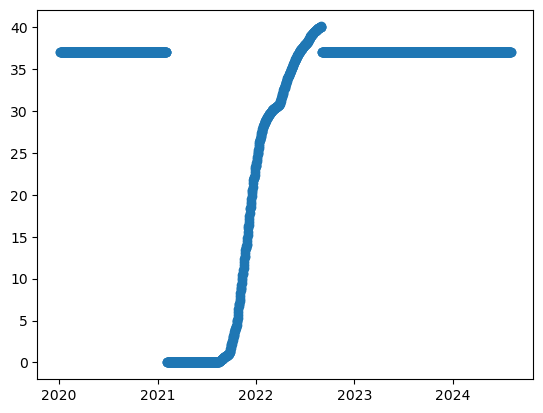

In [223]:
plt.scatter(x = data_usa['date'],
           y = data_usa['total_boosters_per_hundred'])

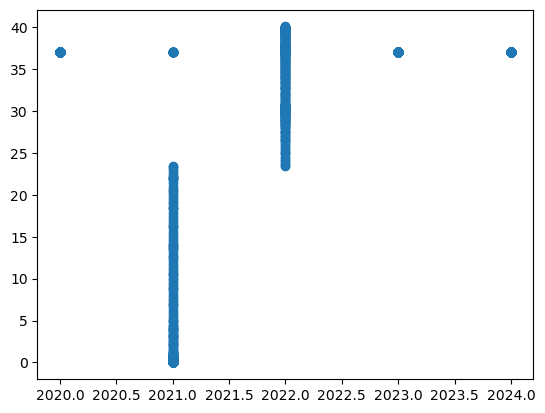

In [224]:
plt.scatter(x = data_usa['date'].dt.year,
           y = data_usa['total_boosters_per_hundred'])

In [ ]:
"""
1. At the end of 2020, all charts shows there was a discontinuity in the use of vaccines.
2. There was high increase of use of vaccine towards the end of 2021, which was around when high record of new cases was recorded.
   lol...you can do CAUSALITY test with the date column to check if there is a cause and effect there.
   But if I am going to judge by the time I have, there was surge in US total cases in the mid 2021 because as at 2021 January, they
   had stopped administering the vaccine.
   Good luck to them.
3. Which makes sense because we can't say US lacks the facilities to contain the virus nor they have extreme poverty level like the India.

"""

In [ ]:
"""
With this, I think I am going to stop on North America now and move to Africa.
"""

### Investigating AFRICA

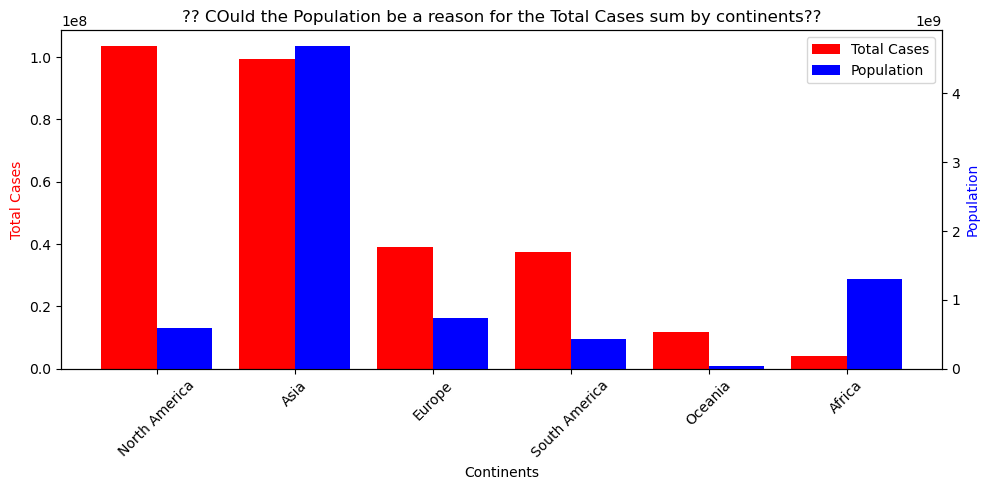

In [227]:
# RECALL PLOT


# Ploting Total cases and Population by continents for easy comparison

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('?? COuld the Population be a reason for the Total Cases sum by continents??')

ax2 = ax.twinx()

X_axis = np.arange(len(cases_by_pop['continent']))
ax.bar(X_axis - 0.2, cases_by_pop['sum_total_cases'], 0.4, label = 'Total Cases', color='red')
ax2.bar(X_axis + 0.2, cases_by_pop['population'], 0.4, label = 'Population', color='blue')

ax.set_xticks(X_axis, cases_by_pop['continent'], rotation=45)
ax.set_xlabel('Continents')
ax.set_ylabel('Total Cases', color='red')

ax2.set_ylabel('Population', color='blue')

tick1, label1 = ax.get_legend_handles_labels()
tick2, label2 = ax2.get_legend_handles_labels()
tick = tick1 + tick2
label = label1 + label2
plt.legend(tick, label, loc='upper right')

plt.tight_layout()

plt.show()

<Axes: xlabel='index'>

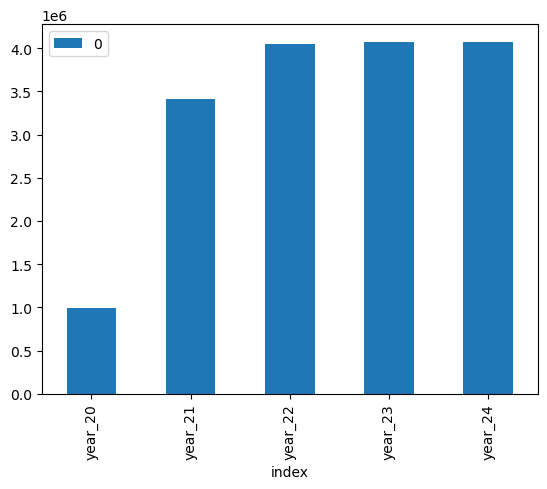

In [230]:
# For Africa alone

total_cases_by_continent[total_cases_by_continent['continent']=='Africa'].transpose().reset_index().drop(0,axis=0).rename(columns={3:'Total Cases'}).plot(kind='bar',x='index',y=0)

In [ ]:
"""
Seems Africa was able to quikly contain the outbreak. Froom 2022 till 2024, they had a steady approximate numbers.

"""

In [231]:
data_africa = data[data['continent']=='Africa']
data_africa

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
5022,DZA,Africa,Algeria,2020-01-05,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,30.4,83.741,1.9,76.88,0.748,44903228,64785.667923,10.252571,11.081299,1867.60457
5023,DZA,Africa,Algeria,2020-01-06,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,30.4,83.741,1.9,76.88,0.748,44903228,64785.667923,10.252571,11.081299,1867.60457
5024,DZA,Africa,Algeria,2020-01-07,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,30.4,83.741,1.9,76.88,0.748,44903228,64785.667923,10.252571,11.081299,1867.60457
5025,DZA,Africa,Algeria,2020-01-08,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,30.4,83.741,1.9,76.88,0.748,44903228,64785.667923,10.252571,11.081299,1867.60457
5026,DZA,Africa,Algeria,2020-01-09,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,30.4,83.741,1.9,76.88,0.748,44903228,64785.667923,10.252571,11.081299,1867.60457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429430,ZWE,Africa,Zimbabwe,2024-07-31,266386.0,0.0,0.000000,5740.0,0.0,0.000000,...,30.7,36.791,1.7,61.49,0.571,16320539,64785.667923,10.252571,11.081299,1867.60457
429431,ZWE,Africa,Zimbabwe,2024-08-01,266386.0,0.0,0.000000,5740.0,0.0,0.000000,...,30.7,36.791,1.7,61.49,0.571,16320539,64785.667923,10.252571,11.081299,1867.60457
429432,ZWE,Africa,Zimbabwe,2024-08-02,266386.0,0.0,0.000000,5740.0,0.0,0.000000,...,30.7,36.791,1.7,61.49,0.571,16320539,64785.667923,10.252571,11.081299,1867.60457
429433,ZWE,Africa,Zimbabwe,2024-08-03,266386.0,0.0,0.000000,5740.0,0.0,0.000000,...,30.7,36.791,1.7,61.49,0.571,16320539,64785.667923,10.252571,11.081299,1867.60457


In [232]:
# Pivot table to see the total cases by continents

pivot_table_africa = data_africa.pivot_table(index=['location'],
                              values=['total_cases','population'],
                              aggfunc='max').reset_index()
pivot_table_africa.sort_values(by='total_cases', ascending=False)


,location,population,total_cases
41,South Africa,59893884,4072765.0
31,Morocco,37457976,1279115.0
46,Tunisia,12356116,1153361.0
12,Egypt,110990096,516023.0
25,Libya,6812344,507269.0
16,Ethiopia,123379928,501193.0
48,Zambia,20017670,349842.0
22,Kenya,54027484,344106.0
3,Botswana,2630300,330696.0
30,Mauritius,1299478,328167.0


In [237]:
4072765.0-1279115.0

2793650.0

In [ ]:
"""
Though overall Africa had the the relative low number of 1 out of 370+ persons. But South Africa still had high nunbers that ia over 200% of the immediate country.
So let's check into South Africa to see if we can learn anything from there.

"""

In [239]:
data_south_africa = data_africa[data_africa['location']=='South Africa']
data_south_africa

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
355890,ZAF,Africa,South Africa,2020-01-05,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,33.2,43.993,2.32,64.13,0.709,59893884,241.100000,2.370000,2.370000,4.100206
355891,ZAF,Africa,South Africa,2020-01-06,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
355892,ZAF,Africa,South Africa,2020-01-07,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
355893,ZAF,Africa,South Africa,2020-01-08,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
355894,ZAF,Africa,South Africa,2020-01-09,0.0,0.0,2510.397659,0.0,0.0,22.856527,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357559,ZAF,Africa,South Africa,2024-07-31,4072765.0,0.0,0.286000,102595.0,0.0,0.000000,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
357560,ZAF,Africa,South Africa,2024-08-01,4072765.0,0.0,0.286000,102595.0,0.0,0.000000,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
357561,ZAF,Africa,South Africa,2024-08-02,4072765.0,0.0,0.286000,102595.0,0.0,0.000000,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570
357562,ZAF,Africa,South Africa,2024-08-03,4072765.0,0.0,0.286000,102595.0,0.0,0.000000,...,33.2,43.993,2.32,64.13,0.709,59893884,64785.667923,10.252571,11.081299,1867.604570


C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\4097159013.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_africa[data_africa['location']=='South Africa'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in South Africa in the these 4 years (total cases??')

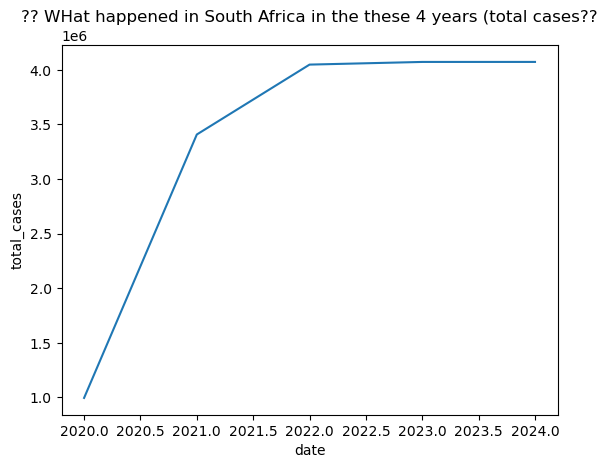

In [241]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_africa[data_africa['location']=='South Africa'],
                x=data_africa['date'].dt.year,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in South Africa in the these 4 years (total cases??')

In [ ]:
"""
Lets see their new cases in 2021

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\420807065.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_africa[data_africa['location']=='South Africa'],
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? WHat happened in South Africa in the these 2021 years (total cases??')

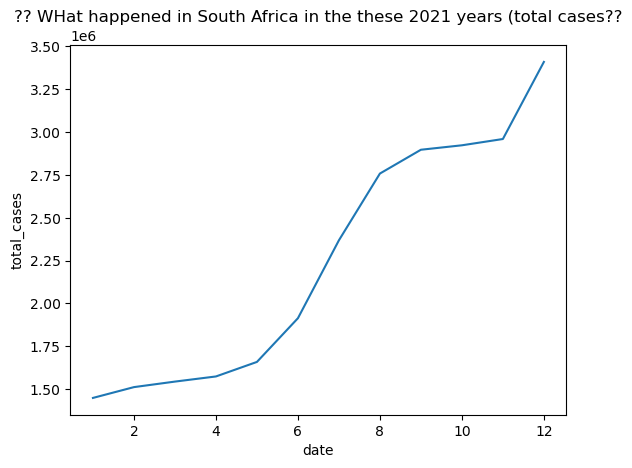

In [242]:
# How cases in each continents progressed over the years

sns.lineplot(data=data_africa[data_africa['location']=='South Africa'],
                x=data_africa[data_africa['date'].dt.year==2021]['date'].dt.month,
                y='total_cases',
#             hue='continent',
             estimator='max',
             ci=None).set_title('?? WHat happened in South Africa in the these 2021 years (total cases??')

In [ ]:
"""
Generally, 2021 was a rise for most countries in the world.
SOuth Africa had increase starting from around April, 2021 till the end of the year.

Let's see the new_cases record

"""

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\1594702977.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_south_africa,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? New cases South Africa recorded in the these 4 years??')

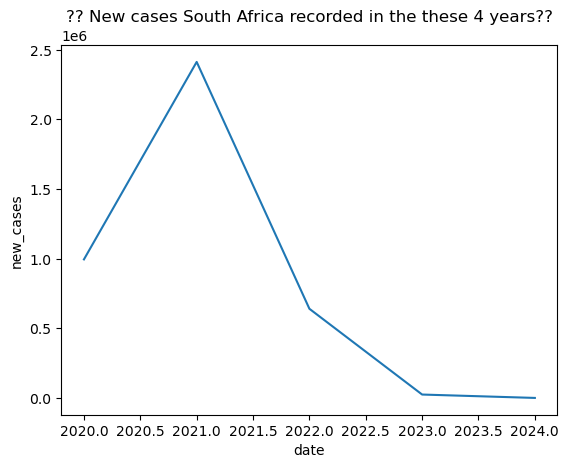

In [244]:
# New cases rate in United statesSouth Africa
# How cases in each continents progressed over the years

sns.lineplot(data=data_south_africa,
                x=data_south_africa['date'].dt.year,
                y='new_cases',
#             hue='continent',
             estimator='sum',
             ci=None
               ).set_title('?? New cases South Africa recorded in the these 4 years??')

In [ ]:
"""
Whatsoever they did to have low record of new cases, they were serious with it because right from 2021 up to date. their new cases record had declined.

Maybe the same thing the whole Africa continents were doing...lol...let's try to find out. 
We'll plunge directly into the Whole Africa dataset to sniff for their recipe..lol..


"""

In [245]:
# Starting with Correlation of TOTAL CASES

# CORRELATION FOR United States alone

corr_list = []

for col in numerical_columns:
    corr_list.append(data_africa['total_cases'].corr(data_africa[col]))

corr_df = pd.DataFrame(corr_list, numerical_columns.columns, columns=['Correlation Value']).reset_index()

C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [246]:
corr_df

,index,Correlation Value
0,total_cases,1.000000
1,new_cases,0.101434
2,new_cases_smoothed,0.265549
3,total_deaths,0.973711
4,new_deaths,0.087073
...,...,...
57,population,0.202501
58,excess_mortality_cumulative_absolute,0.250515
59,excess_mortality_cumulative,0.138216
60,excess_mortality,0.007942


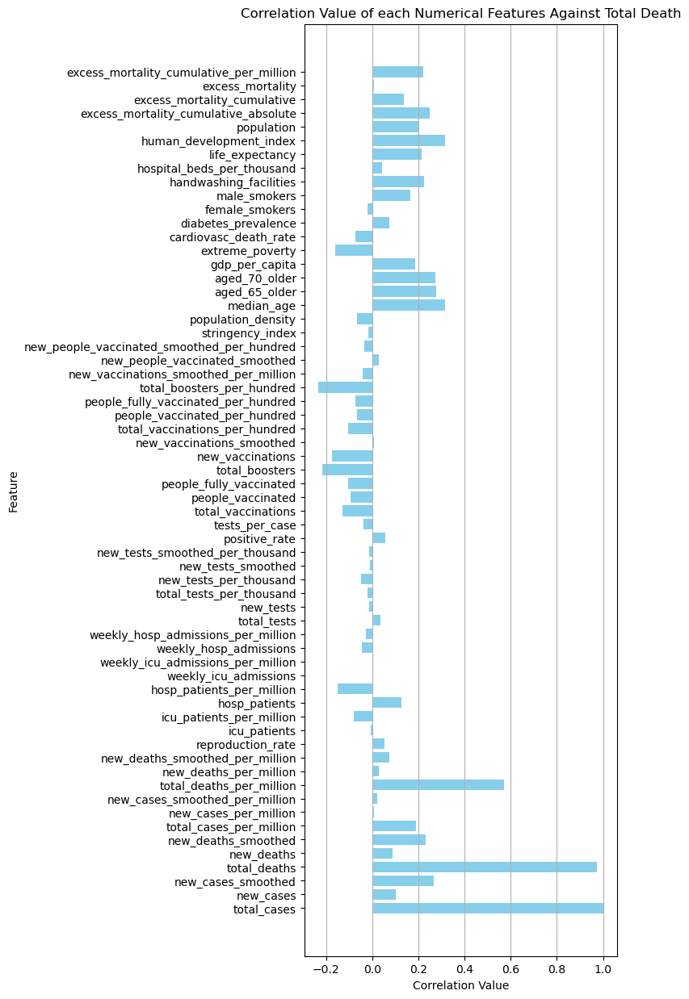

In [247]:
plt.figure(figsize=(5, 15))
plt.barh(numerical_columns.columns, corr_df['Correlation Value'], color='skyblue')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')
plt.title('Correlation Value of each Numerical Features Against Total Death')
plt.grid(axis='x')
plt.show()

In [ ]:
"""
Nothing spectacular. We'll proceedto OLS

"""

In [249]:
# OLS
import statsmodels.api as sm

X = data_africa.drop(['iso_code','continent','location','date','tests_units','total_cases'], axis=1)
X = sm.add_constant(X)
y = data_africa['total_cases']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                 3.007e+04
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:59:58   Log-Likelihood:            -8.6010e+05
No. Observations:               66960   AIC:                         1.720e+06
Df Residuals:                   66900   BIC:                         1.721e+06
Df Model:                          59                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
Again we remove every feature with p-value over .05

new_deaths
new_cases_per_million
new_deaths_per_million
weekly_hosp_admissions
weekly_hosp_admissions_per_million
total_tests_per_thousand
positive_rate
tests_per_case
people_fully_vaccinated
total_boosters
people_vaccinated_per_hundred
people_fully_vaccinated_per_hundred
total_boosters_per_hundred
population_density
aged_65_older


"""

In [250]:
# OLS
import statsmodels.api as sm

X = data_africa.drop(['iso_code','continent','location','date','tests_units','total_cases','new_deaths','new_cases_per_million','new_deaths_per_million',
                     'weekly_hosp_admissions','weekly_hosp_admissions_per_million','total_tests_per_thousand','positive_rate','tests_per_case',
                     'people_fully_vaccinated','total_boosters','people_vaccinated_per_hundred','people_fully_vaccinated_per_hundred',
                     'total_boosters_per_hundred','population_density','aged_65_older'], axis=1)
X = sm.add_constant(X)
y = data_africa['total_cases']


# Split your data set into 80/20 for train/test datasets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=1)


# create a fitted model & print the summary
y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)

lm = sm.OLS(y_train, X_train).fit()


print(lm.summary(xname=list(X.columns)))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                 4.029e+04
Date:                Sun, 09 Feb 2025   Prob (F-statistic):               0.00
Time:                        23:10:13   Log-Likelihood:            -8.6013e+05
No. Observations:               66960   AIC:                         1.720e+06
Df Residuals:                   66915   BIC:                         1.721e+06
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [ ]:
"""
We have all our features less than .05 now.

Before looking at thefeatures that are obviously Causatives of COVID, some features caught my attention like
gdp_per_capita, extreme_poverty, these coefficent shows that due to the not-enough-financial status of some Africa
countries, it reduced their exposure to the disease...lol..After all if a man does not have money, he should guard his health.
Hence, the strigency_index coeeficient which shoes that an avaerage African was well complaint to the lock down policies. See the
 handwashing_facilities, hospital_beds_per_thousand, coeeficient which are negative as well.
Consequently, weekly_icu_admissions are high showing strict complaince to sending victims to hospitals straight up.
It is worth noting that in spite of getting low vaccination as we can see the coeeficients of various vaccination measures are low, Africa still managed to contain the outbreak as early as 2021.
Apart from other possible measures has weather condition that could have alter downward the rate of spread of the virus as  well as less immigration from other countries outside the continent, I believe Africa did well with the strigency_index measures.                   


Another odd number I thought I could wrap my head around is the coefficient of  diabetes_prevalence....lol..especially
diabetes_prevalence...I think some times there is blessing is some bad things....lol..my point is diabetes could have kept some people close to the hospital which in turn had kept them from the virus.



"""

# Conclusion

C:\Users\OLADOYINBO BABATUNDE\AppData\Local\Temp\ipykernel_11964\1022548101.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data,
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\OLADOYINBO BABATUNDE\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, '?? How did the total cases progress over the years in each continent??')

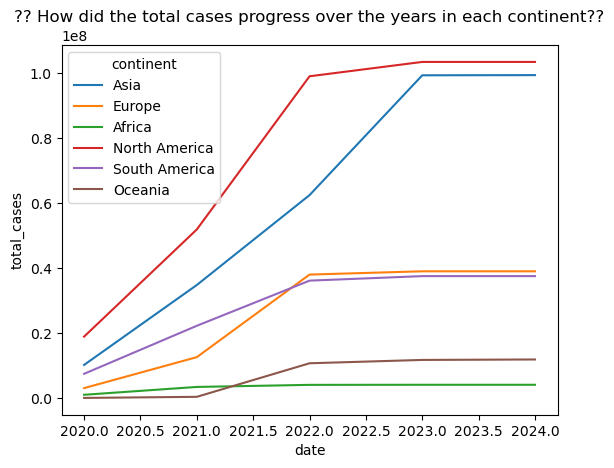

In [251]:
# How cases in each continents progressed over the years

sns.lineplot(data=data,
                x=data['date'].dt.year,
                y='total_cases',
             hue='continent',
             estimator='max',
             ci=None
               ).set_title('?? How did the total cases progress over the years in each continent??')


In [ ]:
"""
I think whart happend in Africa speaks averagely for the other continents that were able to quickly contain the virus as early as 2021, 2022
like Oceania.

So I'll be ending the analysis here. 
It;s been a great journey with you.

Feel free to continue and share insights.

THANK YOU.


"""


### Analysis moltivation : Elma Fortunate.....fortunatecreations.com
### Data credit : ourworldindata


# PLEASE NOTE ALL ANALYSIS, INSIGHTS AND RECOMMENDATIONS ARE BASED ON THE ANALYSIS AND DATA HERE.


# Extras

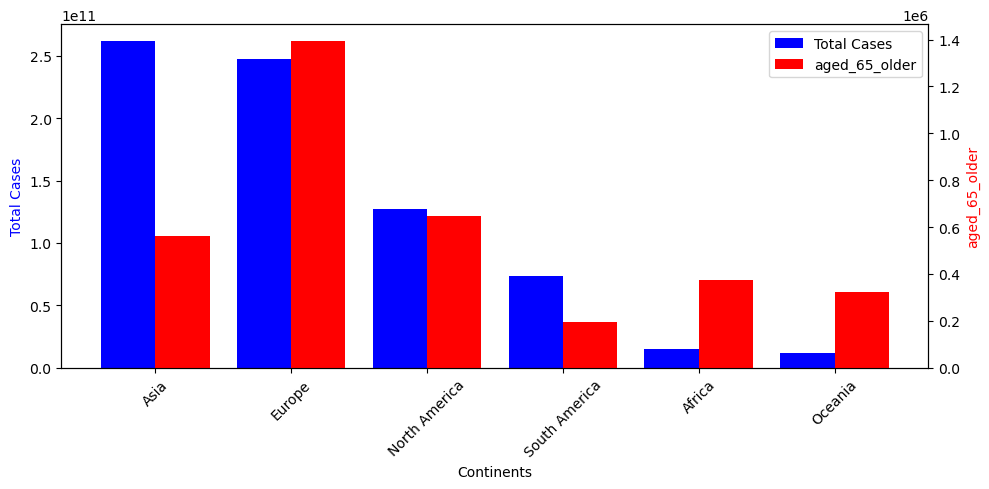

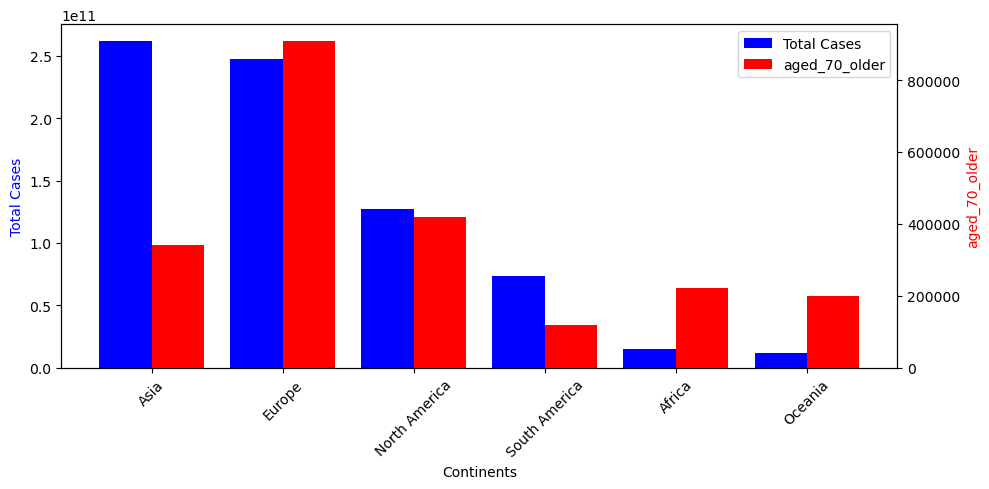

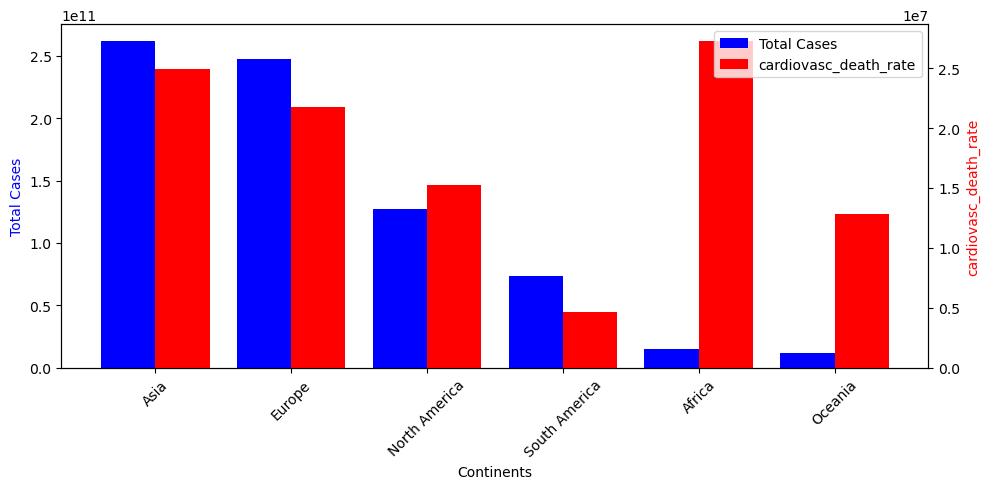

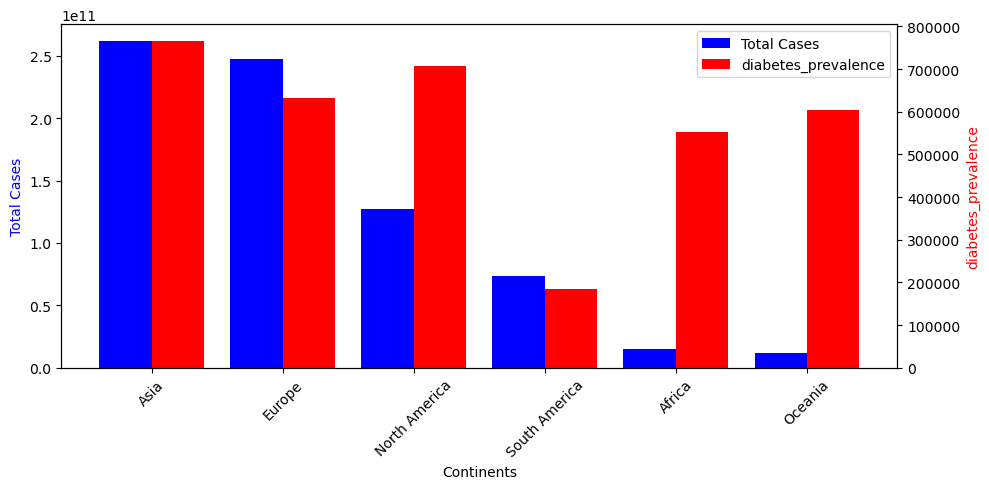

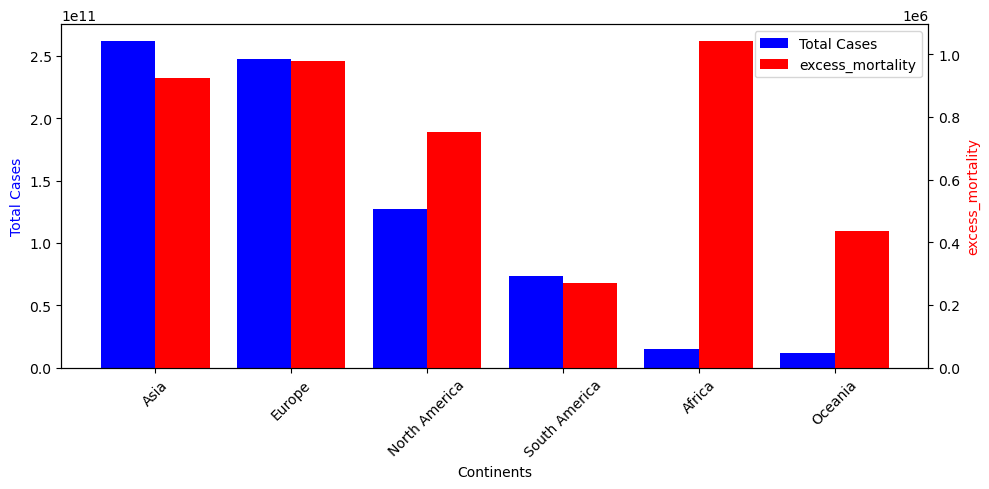

...

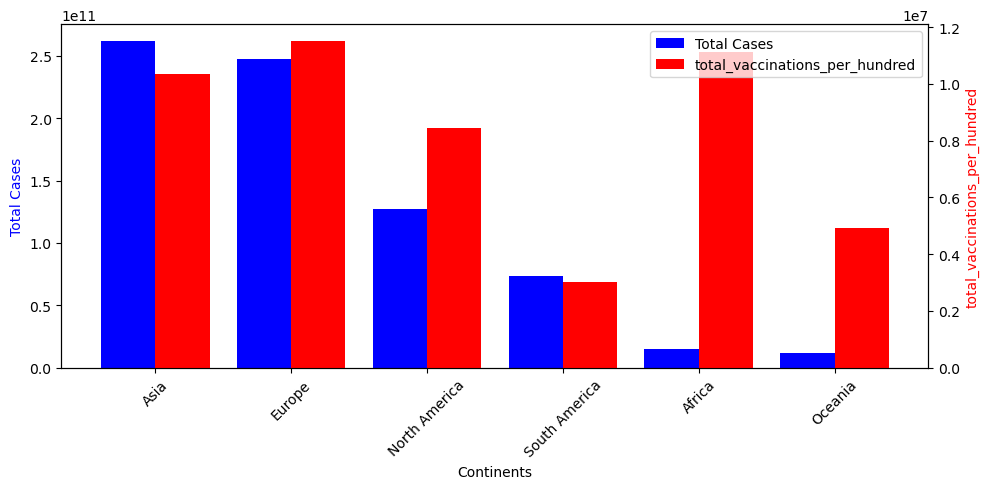

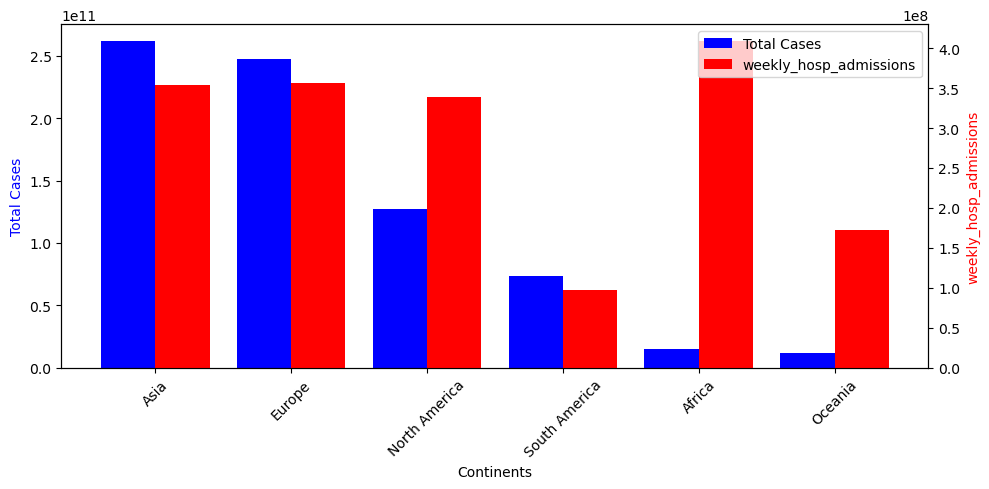

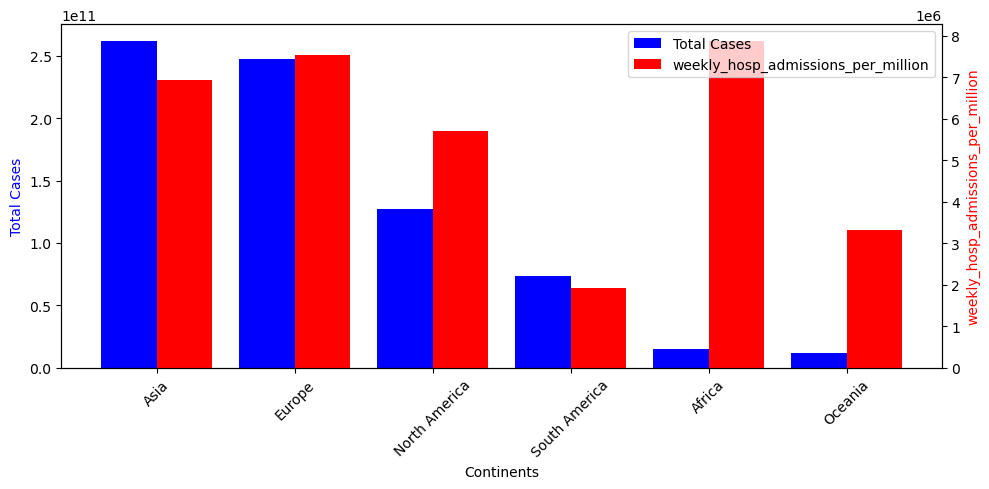

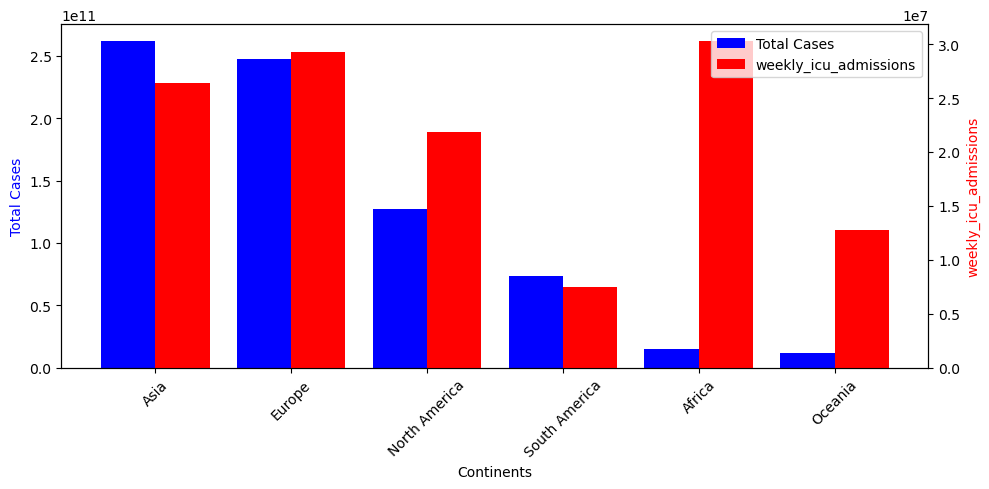

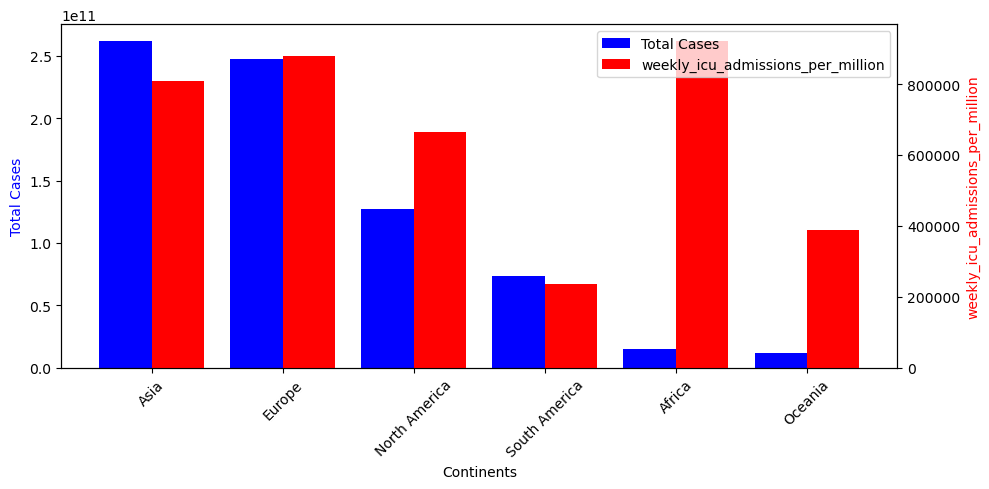

In [382]:
for feature in pivot_table3.columns.drop('continent'):
    fig, ax = plt.subplots(figsize = (10, 5))
#    plt.title(feature, 'and Population by Continents')
    
    ax2 = ax.twinx()
    
    X_axis = np.arange(len(pivot_table3['continent']))
    ax.bar(X_axis - 0.2, pivot_table3['total_cases'], 0.4, label = 'Total Cases', color='blue')
    ax2.bar(X_axis + 0.2, pivot_table3[feature], 0.4, label = feature, color='red')
    
    ax.set_xticks(X_axis, pivot_table3['continent'], rotation=45)
    ax.set_xlabel('Continents')
    ax.set_ylabel('Total Cases', color='blue')
    
    ax2.set_ylabel(feature, color='red')
    
    tick1, label1 = ax.get_legend_handles_labels()
    tick2, label2 = ax2.get_legend_handles_labels()
    tick = tick1 + tick2
    label = label1 + label2
    plt.legend(tick, label, loc='upper right')
    
    plt.tight_layout()
    
    plt.show()

Of a indicators, Africa seems to have a high extreme value for all majority.

Observed that Continents with high Population Density which is supported by the Reproduction rate also have a positvie correlation with the numbers of total cases in such cintinents such as Asia, Europe and North America. Also, they appear to be top 3 continents with the high Life Expectancy value
Europe being the highest in GDP per capita, follow by Asia and North America.

Now, to try to investigate the Death Cases in all continents in order to determine the reason.


In [388]:
pivot_table3.sort_values(by='total_deaths', ascending=False, inplace=True)

In [389]:
pivot_table3

,continent,aged_65_older,aged_70_older,cardiovasc_death_rate,diabetes_prevalence,excess_mortality,excess_mortality_cumulative,excess_mortality_cumulative_absolute,excess_mortality_cumulative_per_million,extreme_poverty,...,total_deaths,total_deaths_per_million,total_tests,total_tests_per_thousand,total_vaccinations,total_vaccinations_per_hundred,weekly_hosp_admissions,weekly_hosp_admissions_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million
2,Europe,1.395855e+06,909993.920310,2.172748e+07,631621.180159,9.787496e+05,874408.172543,4.950803e+09,1.633447e+08,6.146540e+05,...,2.476783e+09,1.548439e+08,1.958660e+12,1.068841e+08,6.682801e+12,1.152720e+07,3.568817e+08,7.523817e+06,2.925515e+07,878413.303614
1,Asia,5.625091e+05,341966.806955,2.493296e+07,766978.792132,9.234700e+05,823918.277747,4.683814e+09,1.482111e+08,8.077706e+05,...,1.903300e+09,3.968066e+07,1.919046e+12,7.492399e+07,1.077305e+13,1.036287e+07,3.541030e+08,6.929068e+06,2.643692e+07,807785.919695
3,North America,6.488190e+05,419445.933264,1.522693e+07,707941.314224,7.519322e+05,671499.749125,4.030934e+09,1.214699e+08,8.061827e+05,...,1.880718e+09,6.642765e+07,1.621219e+12,5.838149e+07,6.143058e+12,8.443734e+06,3.387327e+08,5.705186e+06,2.181962e+07,663862.858605
5,South America,1.953924e+05,118241.812751,4.650284e+06,185572.446845,2.689018e+05,244398.833366,1.338279e+09,4.202291e+07,1.600046e+05,...,1.647006e+09,3.954966e+07,4.123476e+11,1.754944e+07,2.007223e+12,3.024949e+06,9.747526e+07,1.927644e+06,7.463950e+06,235325.793725
0,Africa,3.753080e+05,221929.446751,2.730064e+07,551857.456548,1.043096e+06,933224.795318,5.352761e+09,1.687656e+08,2.714235e+06,...,3.069763e+08,2.038899e+07,1.794259e+12,7.849985e+07,8.347524e+12,1.111486e+07,4.095313e+08,7.882475e+06,3.033314e+07,922887.177734
4,Oceania,3.210038e+05,199397.384260,1.285304e+07,603439.753957,4.357844e+05,387543.002048,2.225569e+09,7.041087e+07,5.202276e+05,...,2.407694e+07,1.268807e+07,7.977121e+11,3.615262e+07,3.575241e+12,4.939411e+06,1.724543e+08,3.319884e+06,1.277394e+07,388647.706042


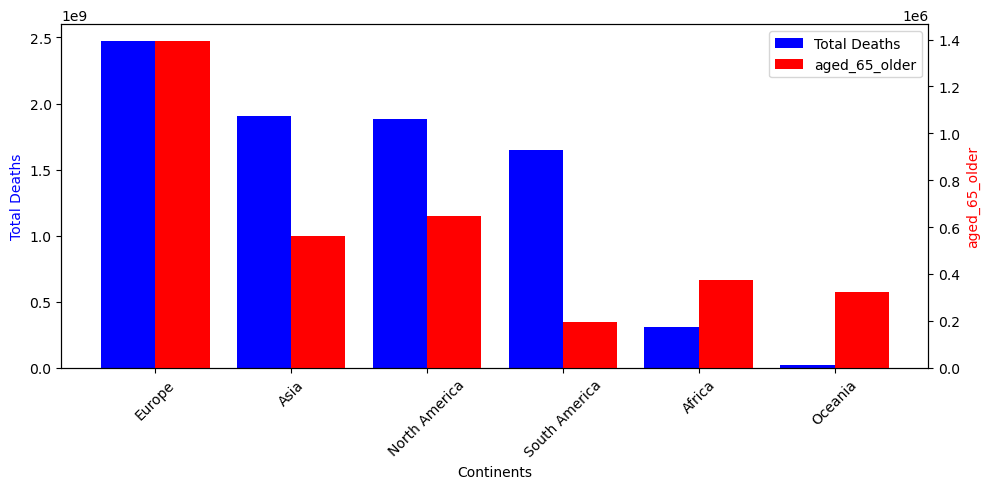

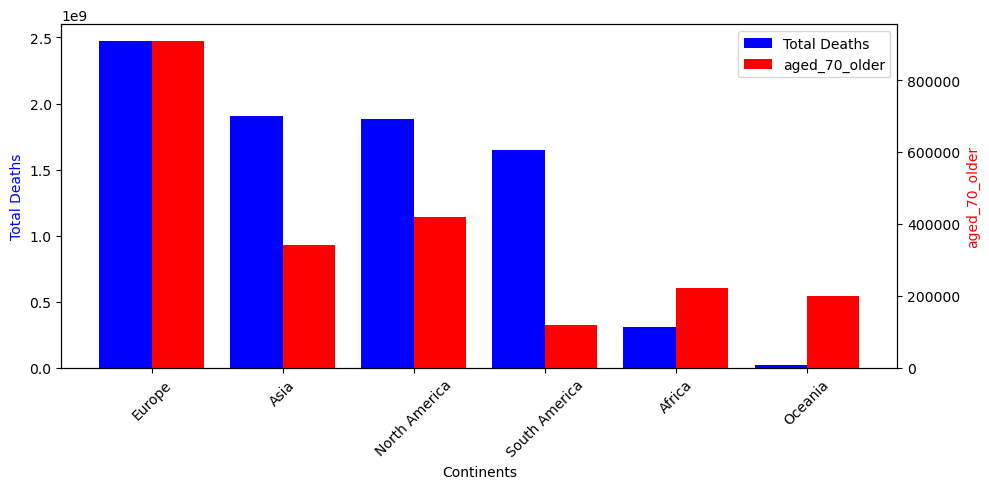

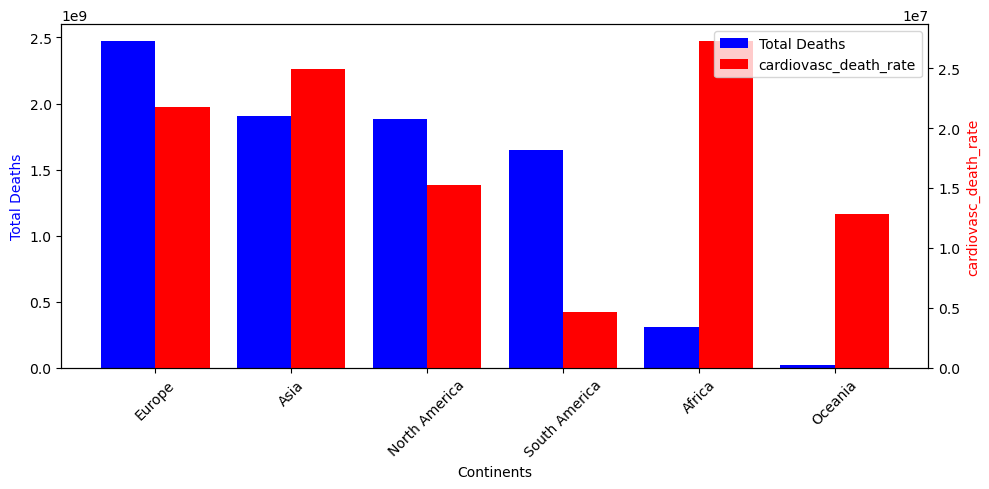

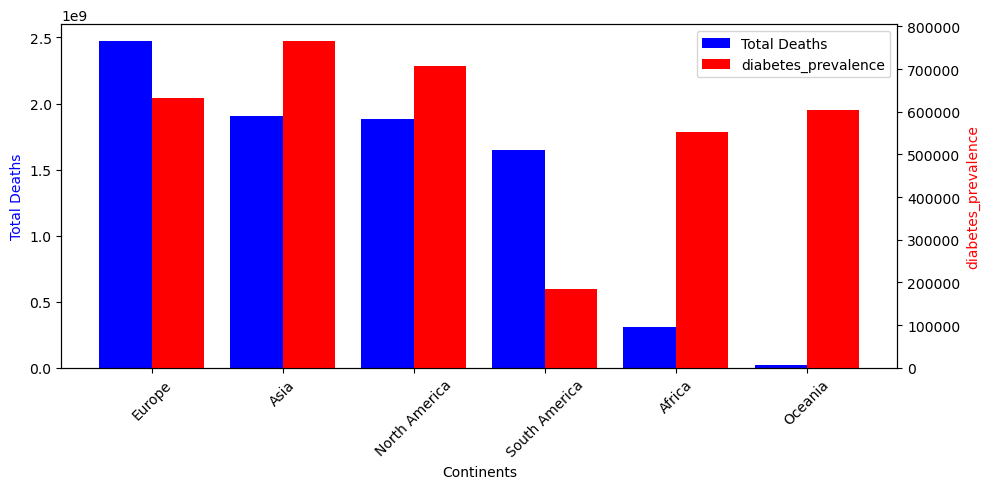

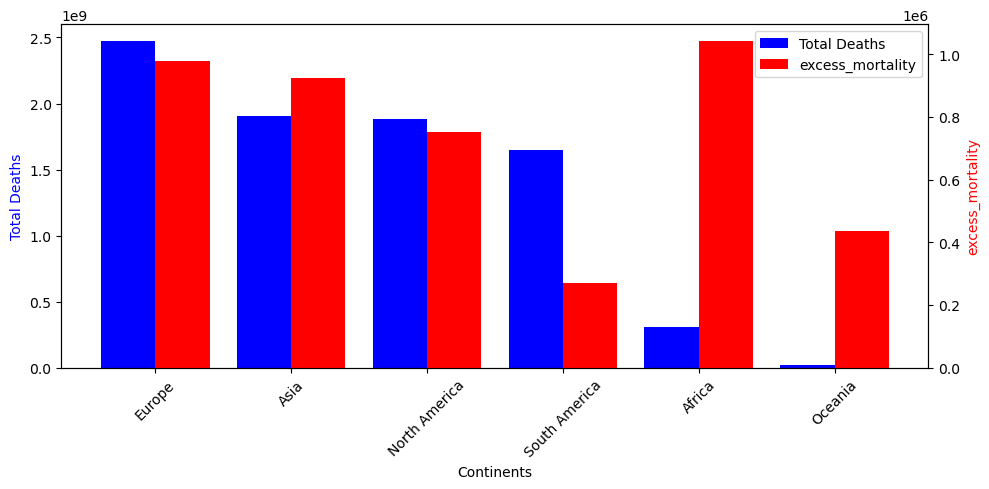

...

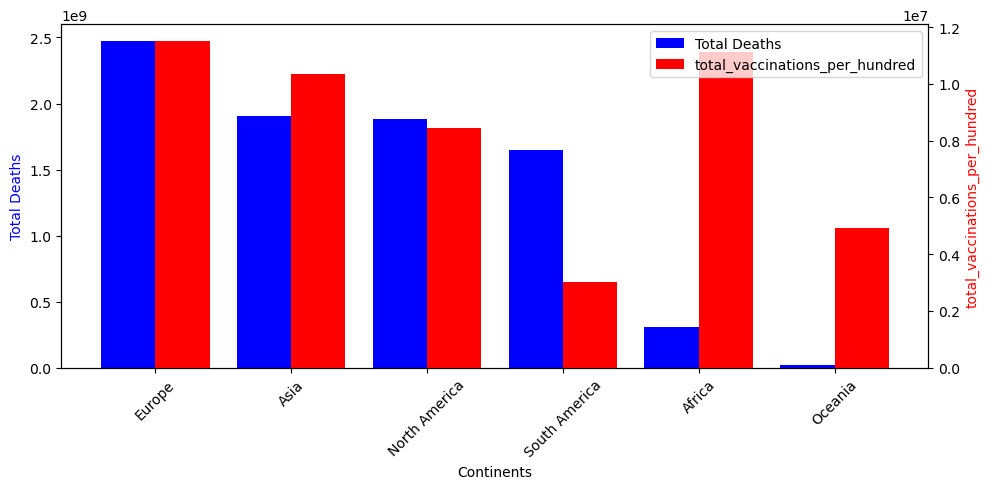

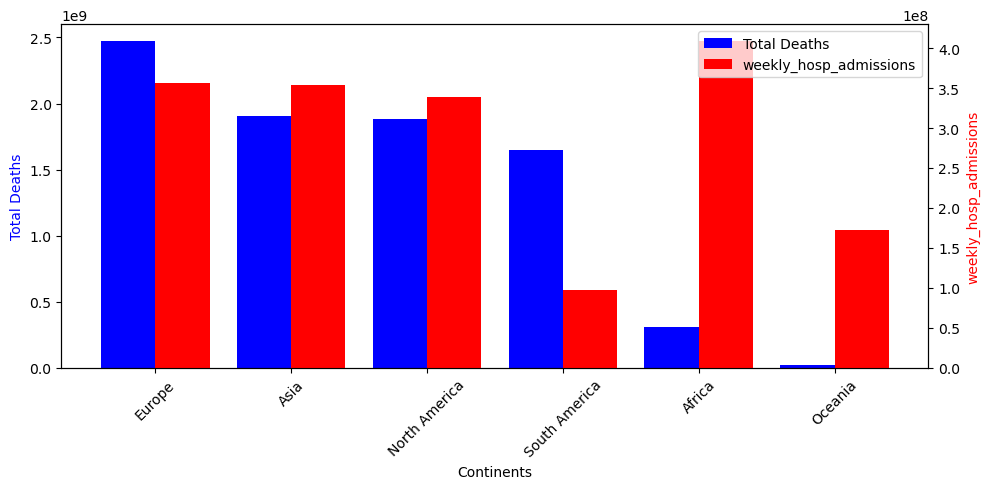

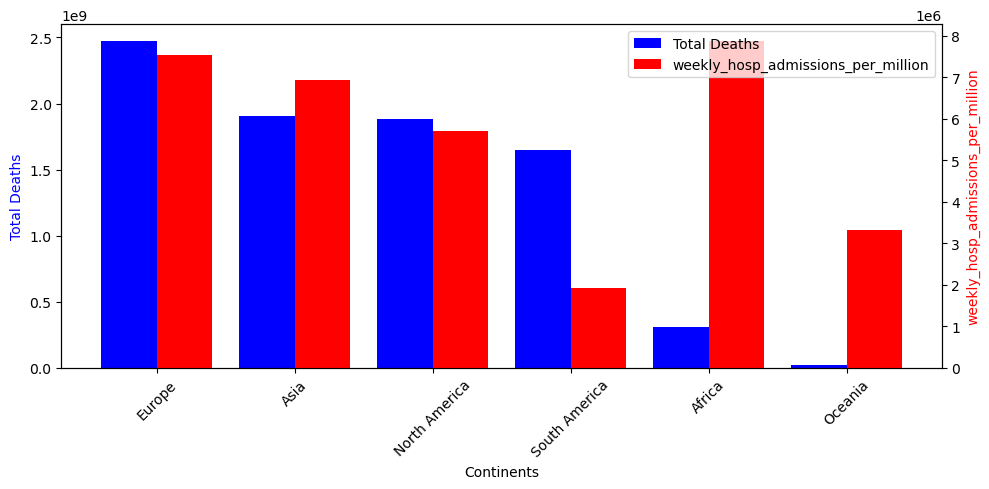

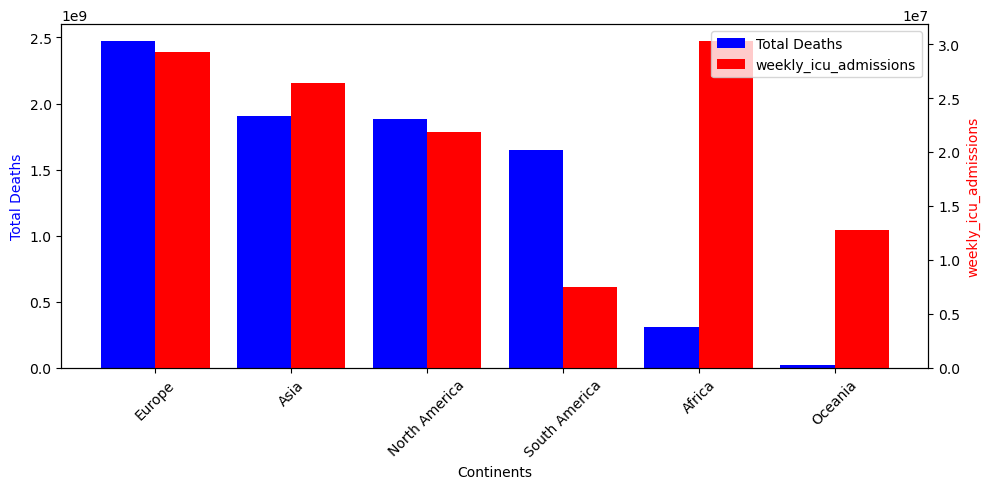

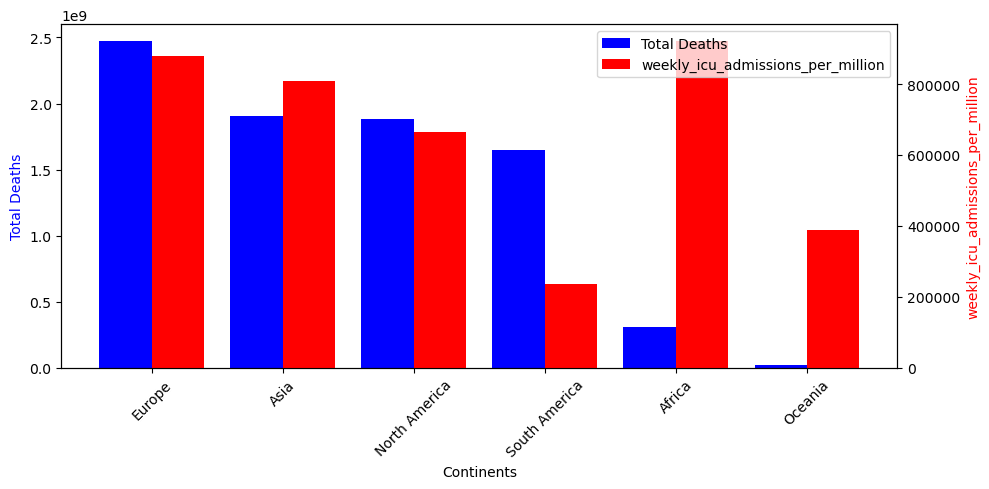

In [390]:
for feature in pivot_table3.columns.drop('continent'):
    fig, ax = plt.subplots(figsize = (10, 5))
#    plt.title(feature, 'and Population by Continents')
    
    ax2 = ax.twinx()
    
    X_axis = np.arange(len(pivot_table3['continent']))
    ax.bar(X_axis - 0.2, pivot_table3['total_deaths'], 0.4, label = 'Total Deaths', color='blue')
    ax2.bar(X_axis + 0.2, pivot_table3[feature], 0.4, label = feature, color='red')
    
    ax.set_xticks(X_axis, pivot_table3['continent'], rotation=45)
    ax.set_xlabel('Continents')
    ax.set_ylabel('Total Deaths', color='blue')
    
    ax2.set_ylabel(feature, color='red')
    
    tick1, label1 = ax.get_legend_handles_labels()
    tick2, label2 = ax2.get_legend_handles_labels()
    tick = tick1 + tick2
    label = label1 + label2
    plt.legend(tick, label, loc='upper right')
    
    plt.tight_layout()
    
    plt.show()

# DEDICATION: For the Lord giveth wisdom: out of his mouth cometh knowledge and understanding.

# ANALYST: oladoyinbobabatundematthew@gmail.com